# Linear Regression Assignment
A bike-sharing system is a service that makes bikes available to people for short-term, shared use that can be paid for or provided for free. Many bike share programmes enable users to pick up a bike from a "dock," which is typically computer-controlled and where they enter their payment details to have the bike unlocked. Then, you can return this bike to a different system-affiliated dock.

### Problem Statement
The ongoing Corona pandemic has recently caused a US bike-sharing company, BoomBikes, to experience significant drops in income. In the current market environment, it is extremely difficult for the organisation to remain viable. It has therefore made the conscious decision to develop a business plan that will enable it to increase revenue as soon as the ongoing lockdown ends and the economy returns to a healthy state.

BoomBikes hopes to understand how people will feel about shared bikes when the current Covid-19-related nationwide quarantine situation ends in this effort. They have planned this in order to differentiate themselves from other service providers and be ready to meet people's requirements when everything improves.

### Business Goals
With the available independent variables, we must model the demand for shared bikes. The management will use it to determine precisely how the needs change with changing features. They can adjust their business approach in accordance with demand levels and client expectations. The model will also help management better grasp the dynamics of demand in a new market.

# Process flow diagram

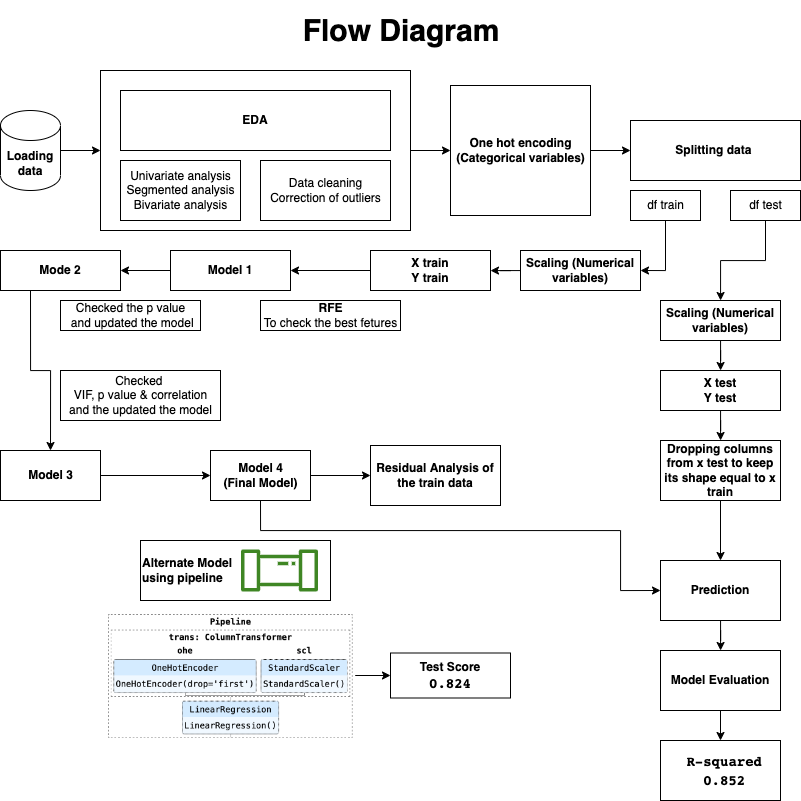

# Importing the libraries

In [110]:
import numpy as np
import pandas as pd
pd.set_option('display.max_rows', None)
import matplotlib.pyplot as plt
import seaborn as sns
import missingno as msno
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import OneHotEncoder
import category_encoders as ce
from sklearn.model_selection import train_test_split
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import r2_score
from sklearn import metrics
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.pipeline import Pipeline

# Loading the data set

In [111]:
day = pd.read_csv("day.csv",low_memory=False)

# A look at the data

In [112]:
day.head()

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,01-01-2018,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,2,02-01-2018,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,3,03-01-2018,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,4,04-01-2018,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,5,05-01-2018,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


# Summary of the data

In [113]:
day.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 730 entries, 0 to 729
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   instant     730 non-null    int64  
 1   dteday      730 non-null    object 
 2   season      730 non-null    int64  
 3   yr          730 non-null    int64  
 4   mnth        730 non-null    int64  
 5   holiday     730 non-null    int64  
 6   weekday     730 non-null    int64  
 7   workingday  730 non-null    int64  
 8   weathersit  730 non-null    int64  
 9   temp        730 non-null    float64
 10  atemp       730 non-null    float64
 11  hum         730 non-null    float64
 12  windspeed   730 non-null    float64
 13  casual      730 non-null    int64  
 14  registered  730 non-null    int64  
 15  cnt         730 non-null    int64  
dtypes: float64(4), int64(11), object(1)
memory usage: 91.4+ KB


In [114]:
day.describe()

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
count,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000,730.000000
mean,365.500000,2.498630,0.500000,6.526027,0.028767,2.997260,0.683562,1.394521,20.319259,23.726322,62.765175,12.763620,849.249315,3658.757534,4508.006849
std,210.877136,1.110184,0.500343,3.450215,0.167266,2.006161,0.465405,0.544807,7.506729,8.150308,14.237589,5.195841,686.479875,1559.758728,1936.011647
min,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,2.424346,3.953480,0.000000,1.500244,2.000000,20.000000,22.000000
25%,183.250000,2.000000,0.000000,4.000000,0.000000,1.000000,0.000000,1.000000,13.811885,16.889713,52.000000,9.041650,316.250000,2502.250000,3169.750000
50%,365.500000,3.000000,0.500000,7.000000,0.000000,3.000000,1.000000,1.000000,20.465826,24.368225,62.625000,12.125325,717.000000,3664.500000,4548.500000
75%,547.750000,3.000000,1.000000,10.000000,0.000000,5.000000,1.000000,2.000000,26.880615,30.445775,72.989575,15.625589,1096.500000,4783.250000,5966.000000
max,730.000000,4.000000,1.000000,12.000000,1.000000,6.000000,1.000000,3.000000,35.328347,42.044800,97.250000,34.000021,3410.000000,6946.000000,8714.000000


In [115]:
day.shape

(730, 16)

# Exploratory Data Analysis

# -----------------------------------------------------------------------------------------

# Checking null values

<AxesSubplot:>

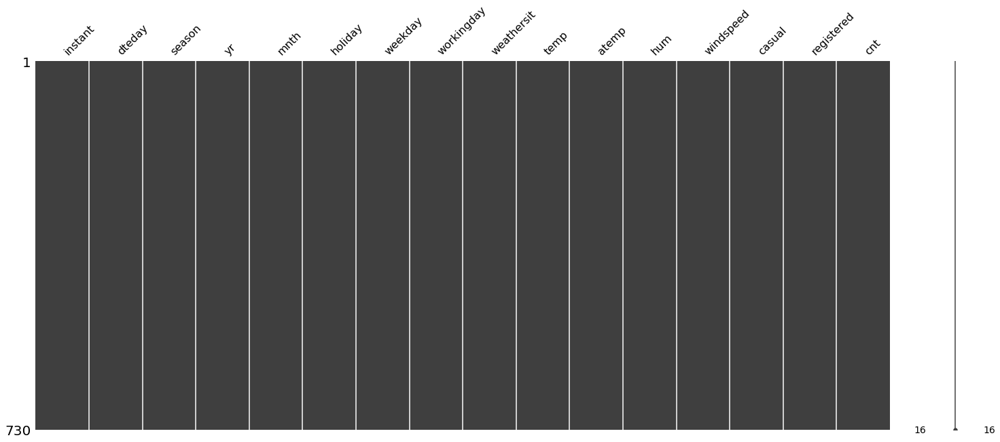

In [116]:
msno.matrix(day)

### From the above summary data we can observe that 
1. There are a total of 16 columns and 730 rows.
2. There are 0 null values in columns.

### Droping the 2 columns 'instant' & 'dteday' as they do not provide any additional information.
1. We have year, month, weekday column so we can drop dteday column.
2. Instant column is nothing but only index number which will be of no use for us.

In [117]:
day.drop(["instant", "dteday" ], axis = 1, inplace = True)

# Univariate Analysis and Segmented Analysis

## Checking for the outliers

### This are the only columns for which we need to check the outliers.

In [118]:
check_outliers = ["temp","atemp","hum","windspeed","cnt","casual","registered"]

## Box Plots

In [119]:
#interactive box
for i in check_outliers:
    #Creating box plot
    print(i)
    #fig = px.box(loan, x='loan_status', y = i, color='loan_status')
    fig = px.box(day, x=i)
    fig.update_layout(
        title='Box Plot of'+ " " + i, 
        xaxis = dict(
            rangeslider = dict(
                visible=True, 
                thickness=0.05
            )
        ), 
        yaxis = dict(

        ), 
        barmode='stack', 
        paper_bgcolor='#FFFFFF', 
        showlegend=True
    )
    fig.show(renderer="iframe")

temp


atemp


hum


windspeed


cnt


casual


registered


## Histograms

In [120]:
#interactive hist
for j in check_outliers:
    fig = px.histogram(day, x= j)
    fig.update_layout(
        title='Histogram of' + " " + j, 
        xaxis = dict(
            rangeslider = dict(
                visible=True, 
                thickness=0.05
            )
        ), 
        yaxis = dict(

        ), 
        barmode='group', 
        paper_bgcolor='#FFFFFF', 
        showlegend=True
    )
    fig.show(renderer="iframe")

## Reviewing histogram, boxplot, and displot for better understanding and comparision.

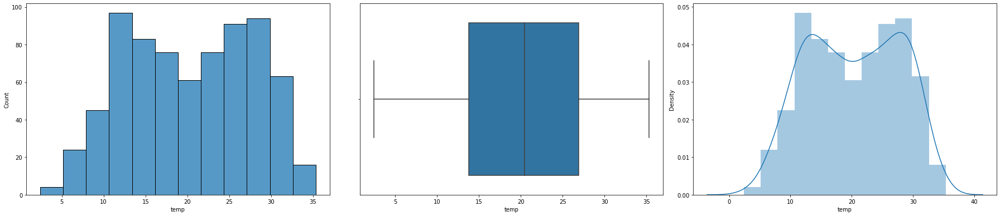

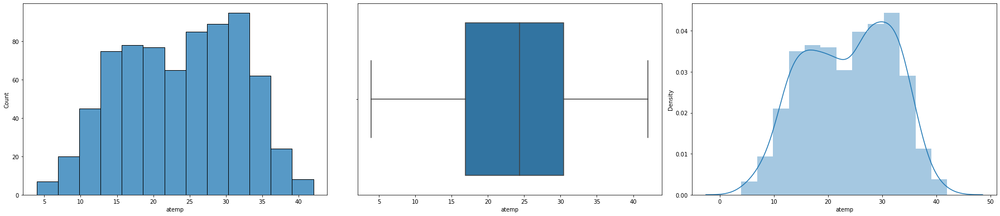

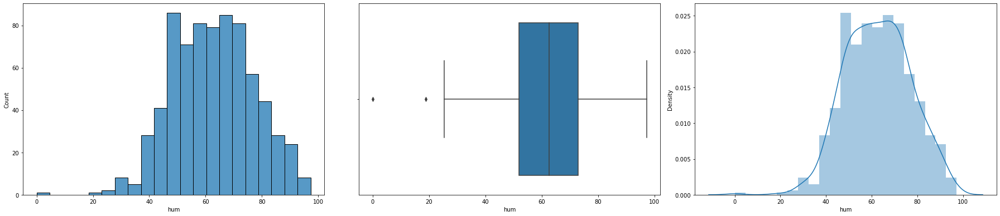

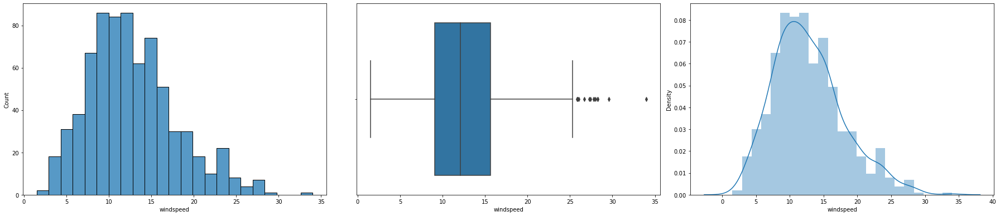

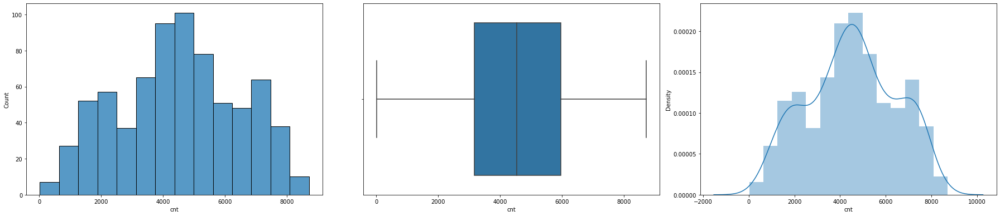

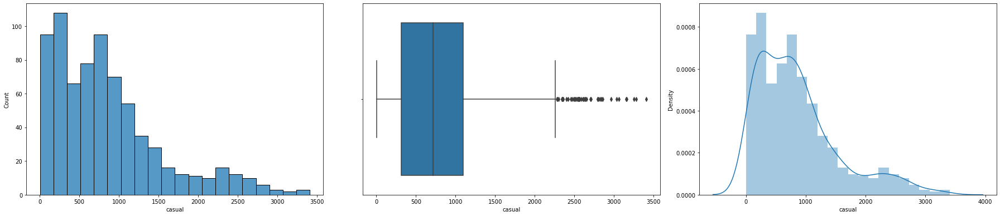

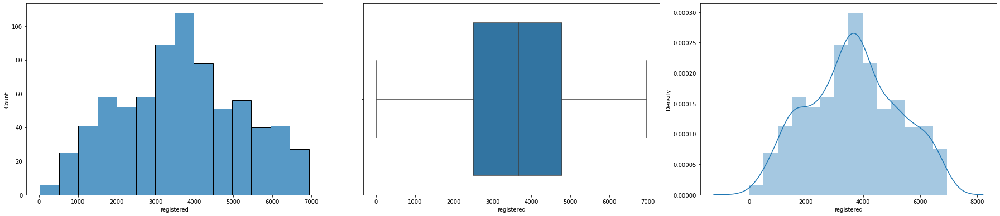

In [121]:
for i in check_outliers:
    plt.rcParams["figure.figsize"] = [25.00, 5.50]
    plt.rcParams["figure.autolayout"] = True
    f, axes = plt.subplots(1, 3)
    sns.color_palette("viridis", as_cmap=True)
    sns.histplot(day[i],ax=axes[0])
    sns.boxplot(day[i],ax=axes[1])
    sns.distplot(day[i],ax=axes[2])
    plt.show()

## Detailed box plot with ever quantile detail.

temp :
count    730.000000
mean      20.319259
std        7.506729
min        2.424346
25%       13.811885
50%       20.465826
75%       26.880615
max       35.328347
Name: temp, dtype: float64


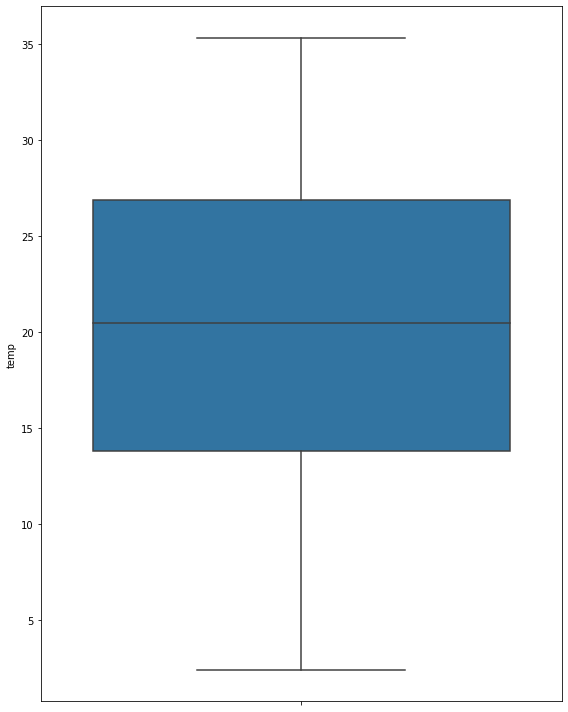

atemp :
count    730.000000
mean      23.726322
std        8.150308
min        3.953480
25%       16.889713
50%       24.368225
75%       30.445775
max       42.044800
Name: atemp, dtype: float64


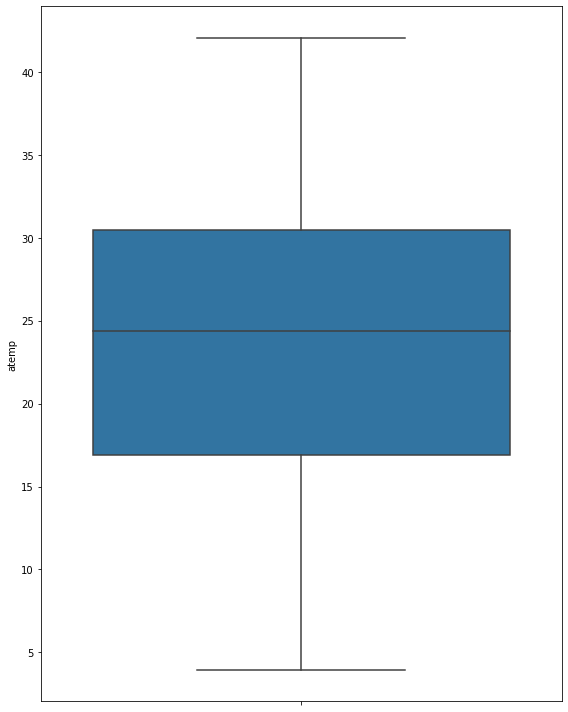

hum :
count    730.000000
mean      62.765175
std       14.237589
min        0.000000
25%       52.000000
50%       62.625000
75%       72.989575
max       97.250000
Name: hum, dtype: float64


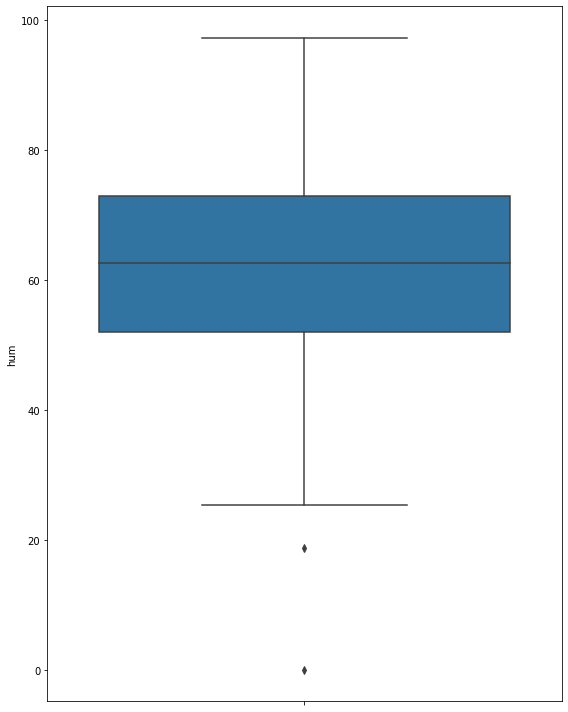

windspeed :
count    730.000000
mean      12.763620
std        5.195841
min        1.500244
25%        9.041650
50%       12.125325
75%       15.625589
max       34.000021
Name: windspeed, dtype: float64


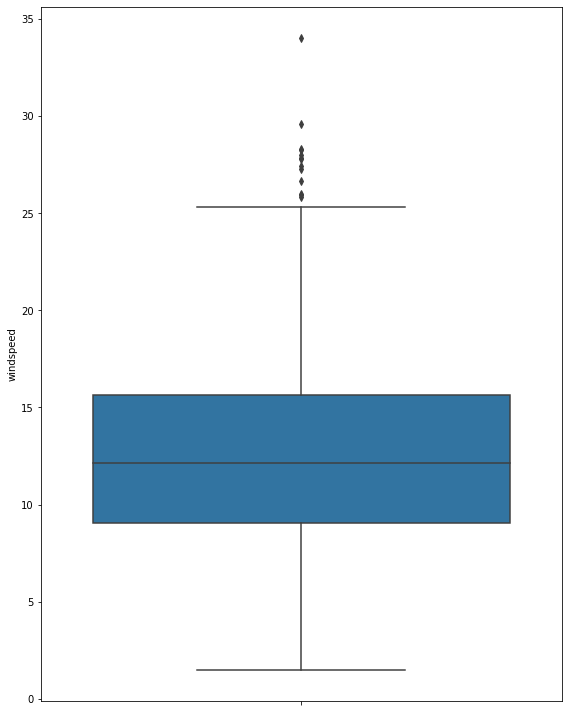

cnt :
count     730.000000
mean     4508.006849
std      1936.011647
min        22.000000
25%      3169.750000
50%      4548.500000
75%      5966.000000
max      8714.000000
Name: cnt, dtype: float64


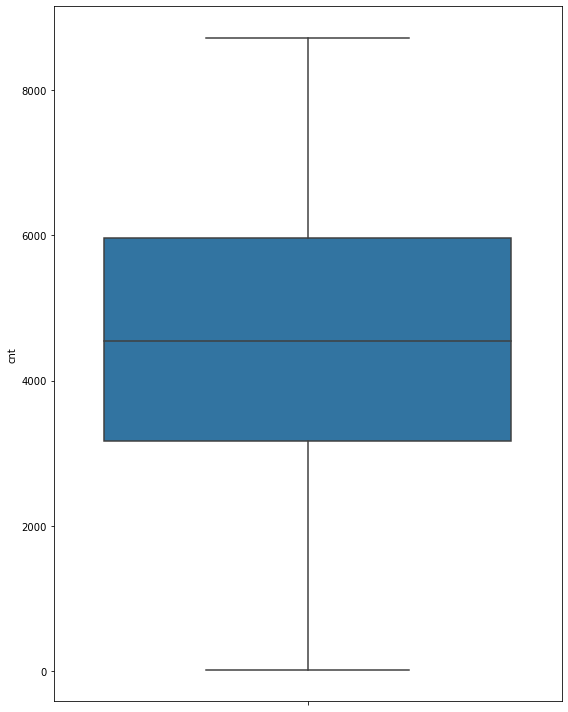

casual :
count     730.000000
mean      849.249315
std       686.479875
min         2.000000
25%       316.250000
50%       717.000000
75%      1096.500000
max      3410.000000
Name: casual, dtype: float64


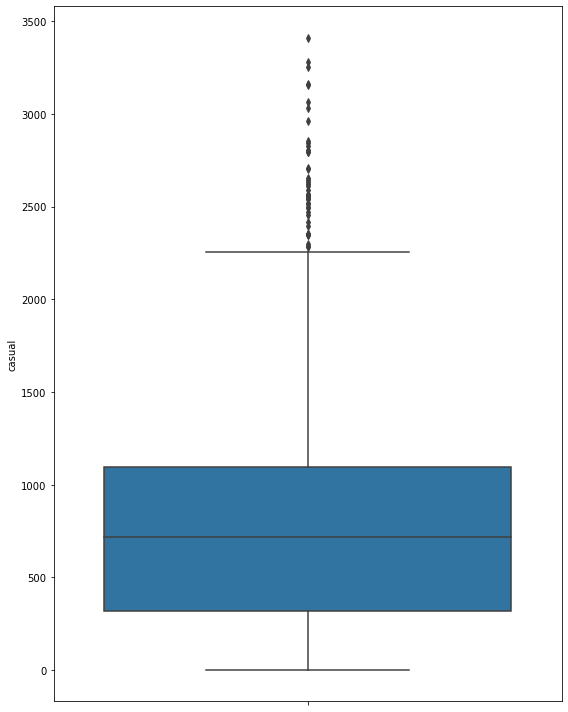

registered :
count     730.000000
mean     3658.757534
std      1559.758728
min        20.000000
25%      2502.250000
50%      3664.500000
75%      4783.250000
max      6946.000000
Name: registered, dtype: float64


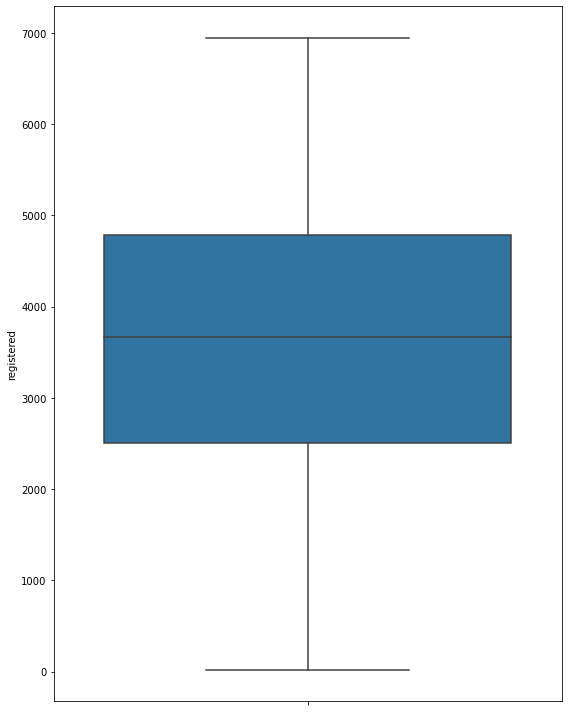

In [122]:
#detail box with all detail
for i in check_outliers:
    plt.figure(figsize=(8,10))
    sns.boxplot(y = day[i])
    print(i,":")
    print(day[i].describe())
    plt.show()

### From the above analysis we got to know there are 2 columns which have outliers.
1. windspeed
2. hum (humidity)

## Fixing the outliers

In [123]:
day.windspeed.quantile([0.50,0.75,0.80,0.85,0.90, 0.95, 0.96, 0.97, 0.98, 0.98, 0.99])

0.50    12.125325
0.75    15.625589
0.80    16.639785
0.85    18.128709
0.90    19.833997
0.95    22.999988
0.96    23.302876
0.97    23.999167
0.98    25.201627
0.98    25.201627
0.99    27.380948
Name: windspeed, dtype: float64

In [124]:
day[day.windspeed >= 27.380948].count()

season        8
yr            8
mnth          8
holiday       8
weekday       8
workingday    8
weathersit    8
temp          8
atemp         8
hum           8
windspeed     8
casual        8
registered    8
cnt           8
dtype: int64

In [125]:
day = day[day.windspeed<25.380948]

In [126]:
day.hum.quantile([0.01,0.02,0.03,0.04,0.50,0.75,0.80,0.85,0.90, 0.99])

0.01    31.419596
0.02    36.013344
0.03    39.221700
0.04    40.216676
0.50    63.083300
0.75    73.250000
0.80    75.358340
0.85    77.660900
0.90    81.891680
0.99    92.850028
Name: hum, dtype: float64

In [127]:
day = day[day.hum>20.380948]

### Rechecking the box plot for the fixed outliers.

temp :
count    716.000000
mean      20.400717
std        7.529887
min        2.424346
25%       13.828962
50%       20.739153
75%       26.931885
max       35.328347
Name: temp, dtype: float64


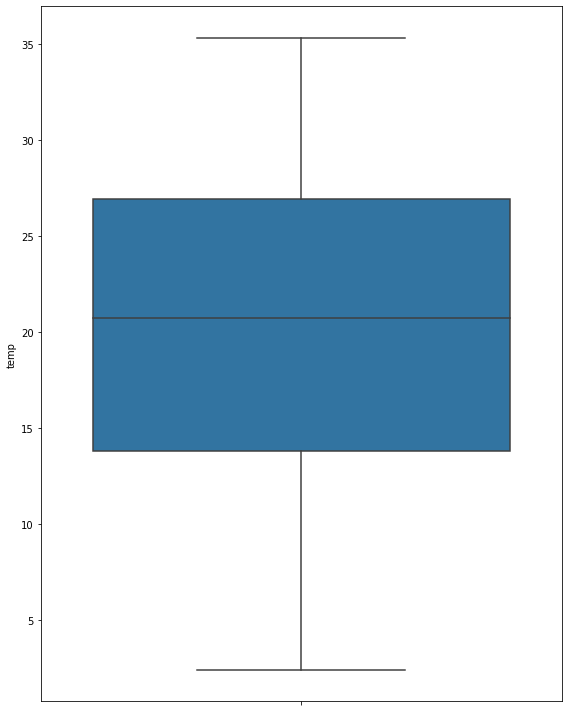

atemp :
count    716.000000
mean      23.821520
std        8.159941
min        3.953480
25%       16.894537
50%       24.605200
75%       30.556050
max       42.044800
Name: atemp, dtype: float64


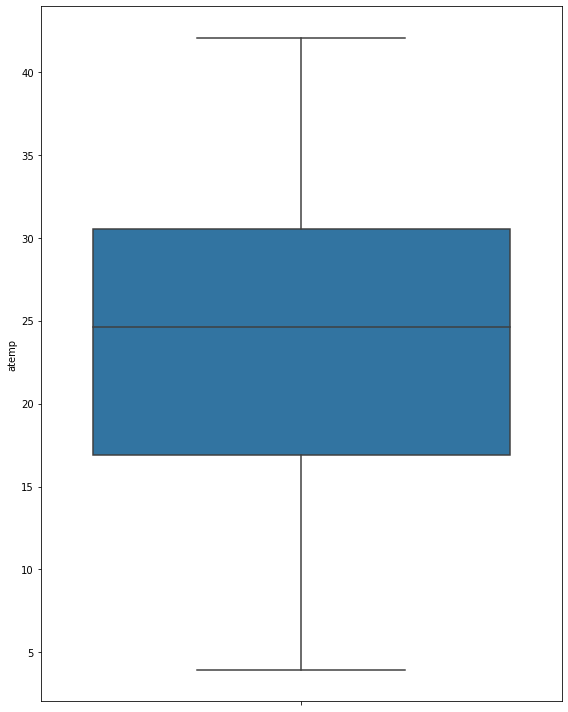

hum :
count    716.000000
mean      63.132034
std       13.916864
min       25.416700
25%       52.458300
50%       63.083300
75%       73.260425
max       97.250000
Name: hum, dtype: float64


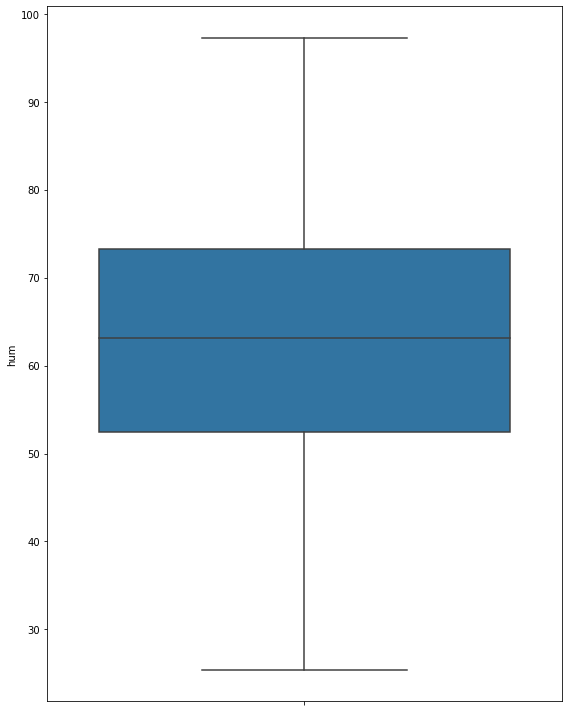

windspeed :
count    716.000000
mean      12.481868
std        4.812977
min        1.500244
25%        8.989859
50%       11.958797
75%       15.458374
max       25.333236
Name: windspeed, dtype: float64


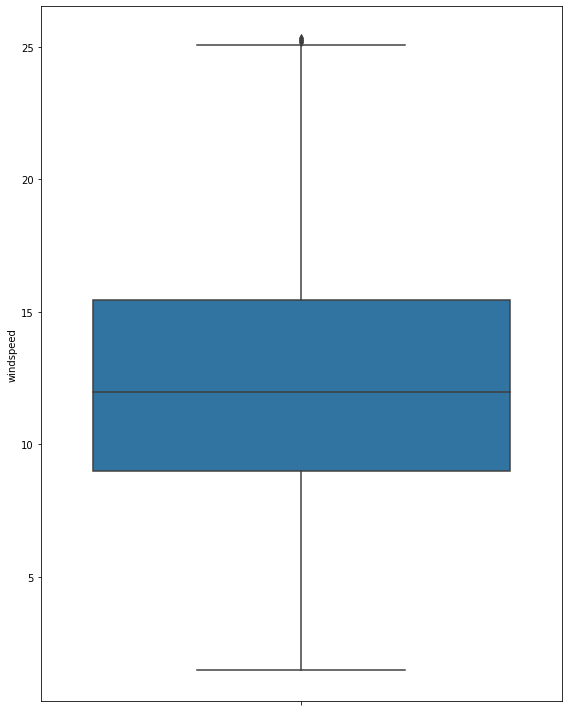

cnt :
count     716.000000
mean     4536.613128
std      1932.256146
min        22.000000
25%      3214.000000
50%      4572.500000
75%      6031.750000
max      8714.000000
Name: cnt, dtype: float64


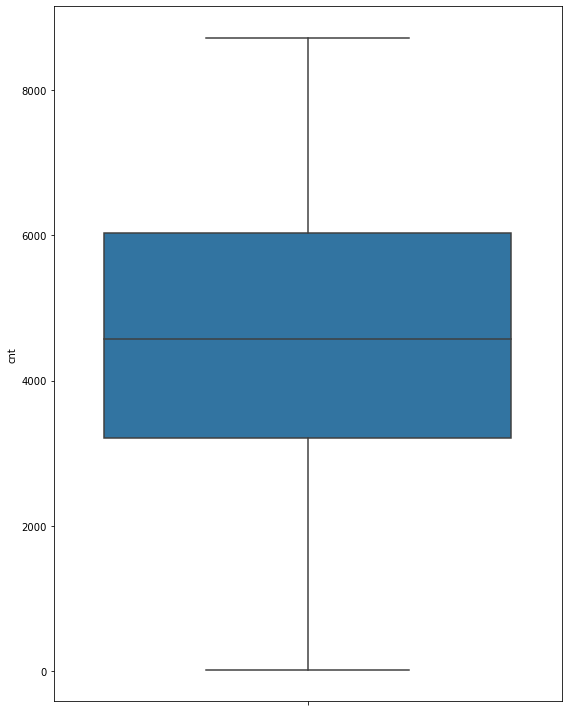

casual :
count     716.000000
mean      858.050279
std       689.118803
min         2.000000
25%       318.000000
50%       727.500000
75%      1120.500000
max      3410.000000
Name: casual, dtype: float64


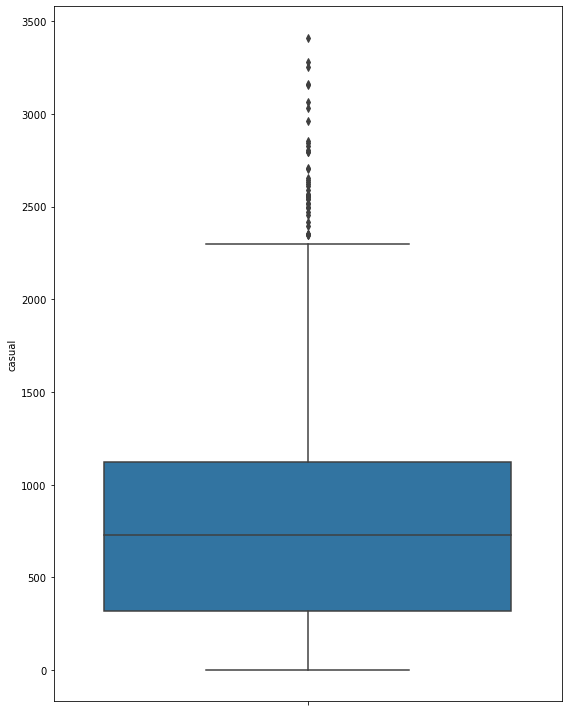

registered :
count     716.000000
mean     3678.562849
std      1557.130705
min        20.000000
25%      2548.000000
50%      3683.000000
75%      4814.250000
max      6946.000000
Name: registered, dtype: float64


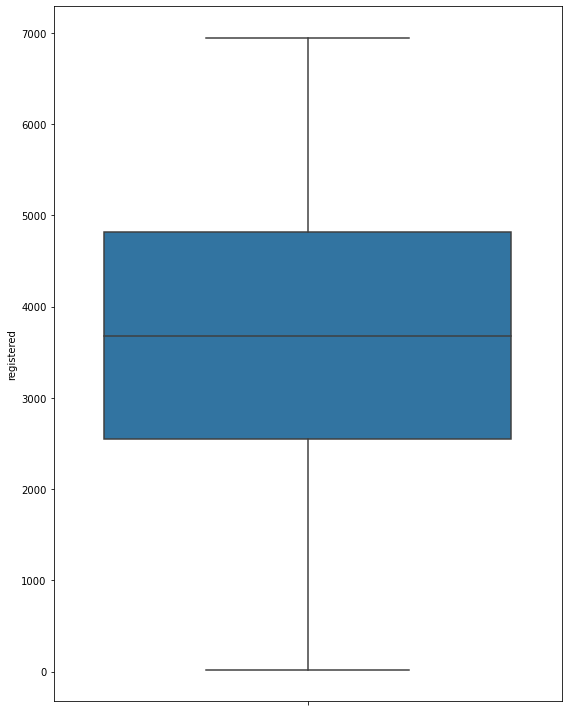

In [128]:
#detail box with all detail
for i in check_outliers:
    plt.figure(figsize=(8,10))
    sns.boxplot(y = day[i])
    print(i,":")
    print(day[i].describe())
    plt.show()

### Listing out the categorical columns.

In [129]:
cat_variables = ["season","yr","mnth","holiday","weekday",
                 "workingday","weathersit"]

## Bar plot (Counting all the categorical variables)

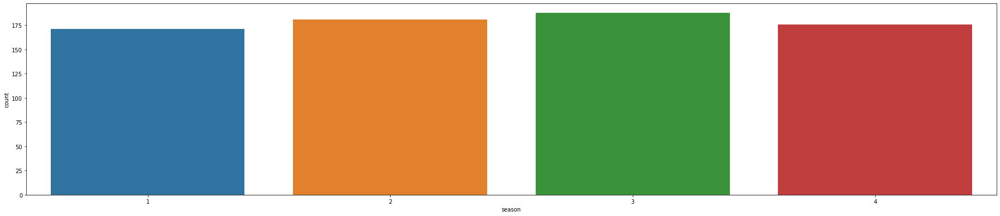

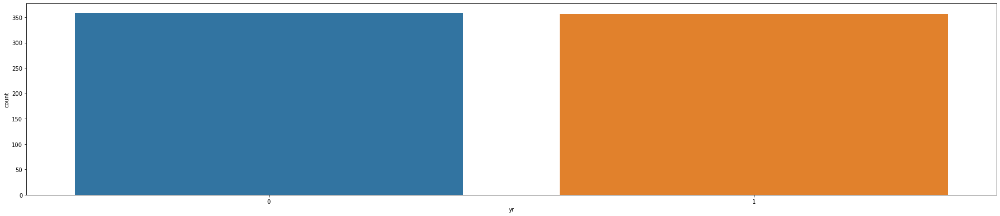

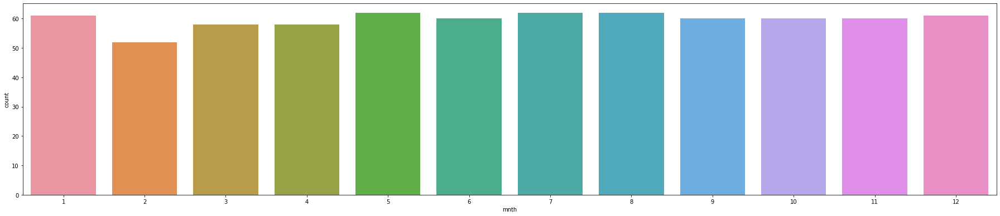

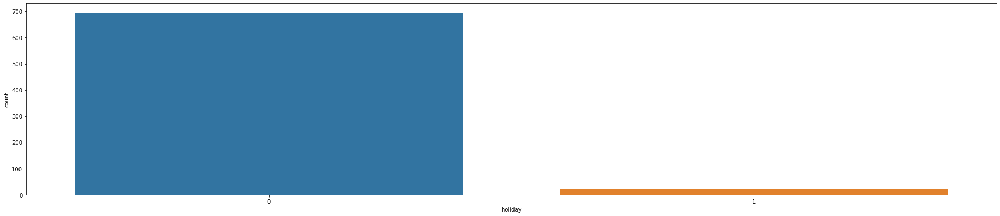

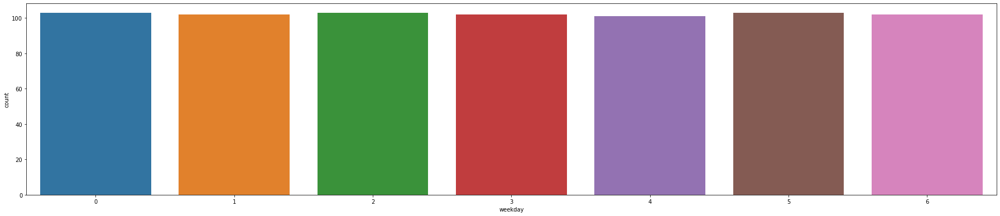

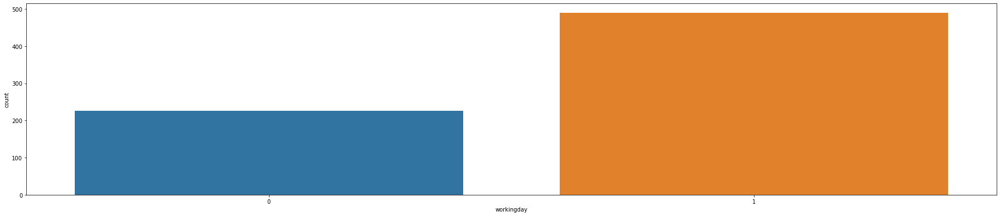

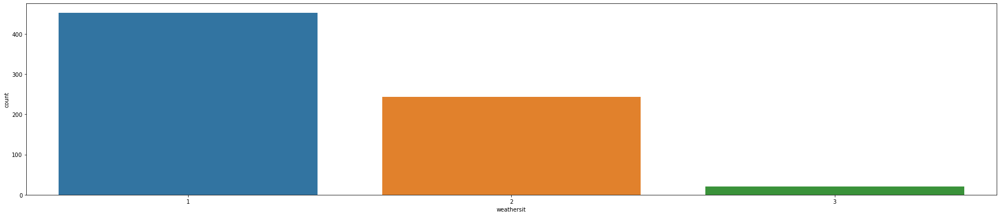

In [130]:
for i in cat_variables:
    sns.countplot(day[i])
    plt.show()

# Bivariate and Extended Segmented Univariate Analysis

### Bar plot between the categories and the target variable (cnt) with every detail {category - sum(cnt)}

            cnt
season         
1        446006
2        908121
3       1061129
4        832959


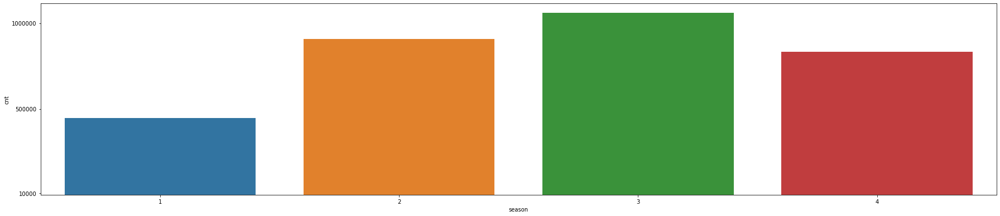

        cnt
yr         
0   1229827
1   2018388


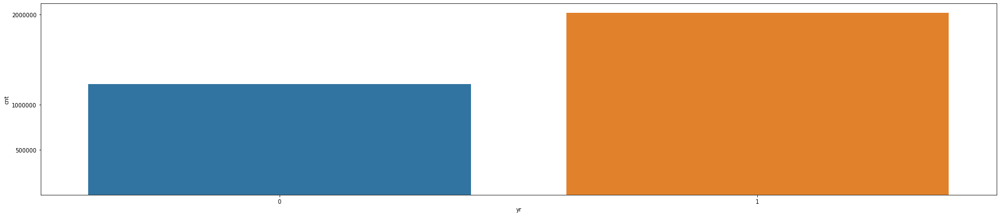

         cnt
mnth        
1     131557
2     141709
3     212788
4     264184
5     331686
6     346342
7     344948
8     351194
9     345991
10    313698
11    254831
12    209287


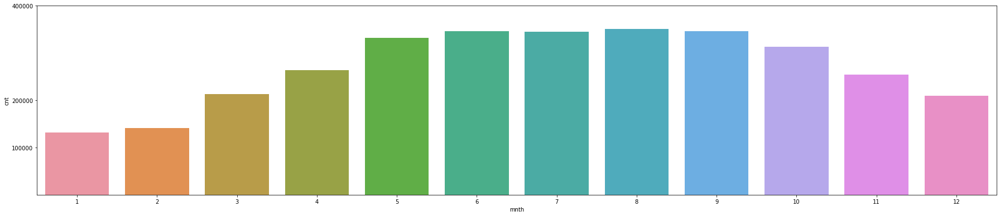

             cnt
holiday         
0        3169780
1          78435


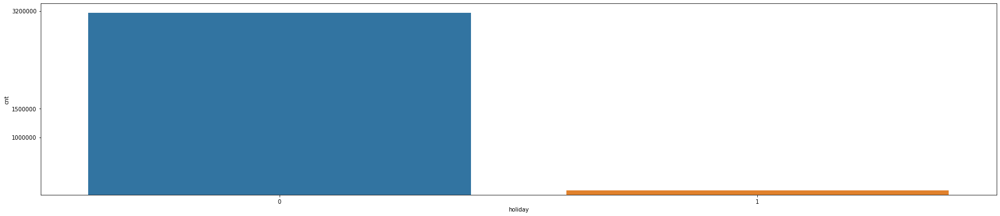

            cnt
weekday        
0        438039
1        444917
2        467314
3        467838
4        475195
5        483221
6        471691


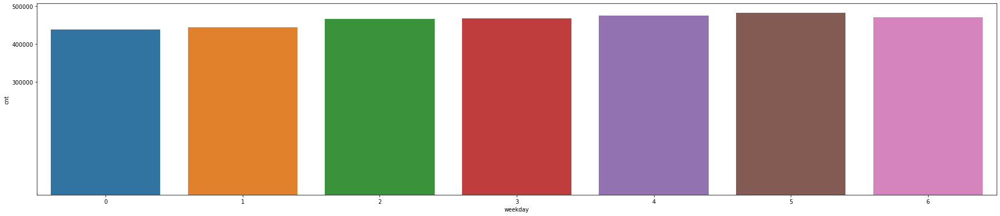

                cnt
workingday         
0            988165
1           2260050


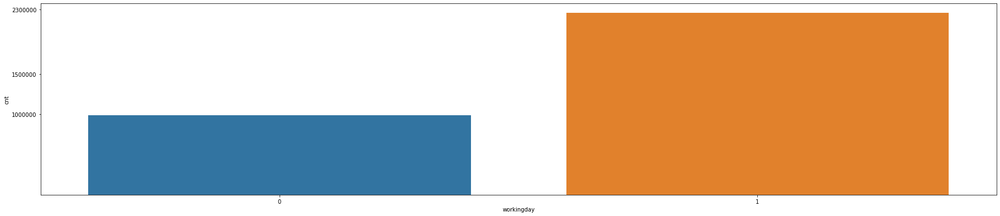

                cnt
weathersit         
1           2226768
2            984201
3             37246


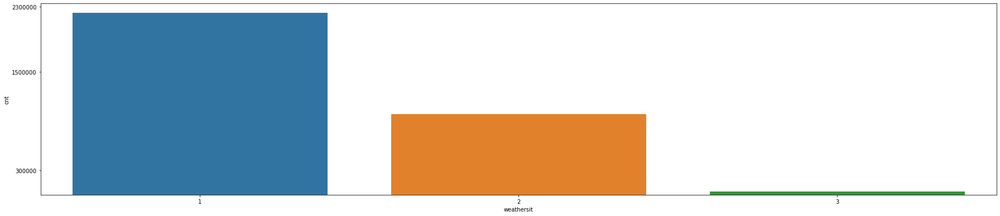

In [131]:
#sum of cnt for all cats
for i in cat_variables:
    sns.countplot()
    b = day.filter([i,'cnt'])
    group_1 = b.groupby(i).sum()
    print(group_1)
    g=sns.barplot(x=group_1.index,y='cnt',data=group_1,estimator= np.sum)
    
 
    if i == "season" :
        ticks = [10000, 500000,1000000]
    elif i == "yr":
        ticks = [500000, 1000000,2000000]
    elif i == "mnth":
        ticks = [100000, 200000,400000]
    elif i == "holiday":
        ticks = [1000000, 1500000,3200000]        
    elif i == "weekday":
        ticks = [300000, 400000,500000] 
    elif i == "workingday":
        ticks = [1000000, 1500000,2300000]
    else:
        ticks = [300000, 1500000,2300000]
    g.set_yticks(ticks)
    g.set_yticklabels(ticks)
    plt.show()

### Bar plot between categories and the target (cnt) with each category as a sub-category (to see data in depth)

   season  yr     cnt
0       1   0  145829
1       1   1  300177
2       2   0  342406
3       2   1  565715
4       3   0  419650
5       3   1  641479
6       4   0  321942
7       4   1  511017


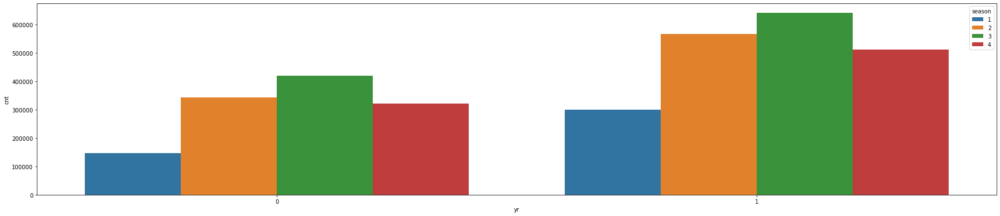

    season  mnth     cnt
0        1     1  131557
1        1     2  141709
2        1     3  131491
3        1    12   41249
4        2     3   81297
5        2     4  264184
6        2     5  331686
7        2     6  230954
8        3     6  115388
9        3     7  344948
10       3     8  351194
11       3     9  249599
12       4     9   96392
13       4    10  313698
14       4    11  254831
15       4    12  168038


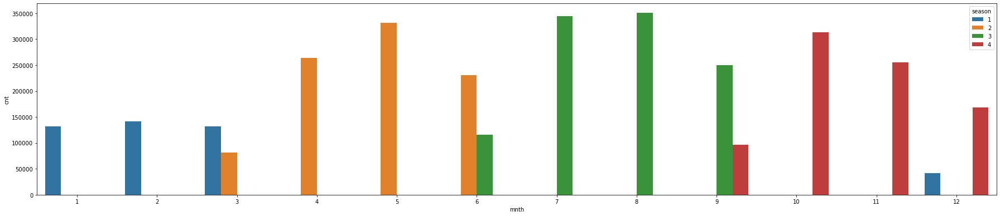

   season  holiday      cnt
0       1        0   434191
1       1        1    11815
2       2        0   888484
3       2        1    19637
4       3        0  1038298
5       3        1    22831
6       4        0   808807
7       4        1    24152


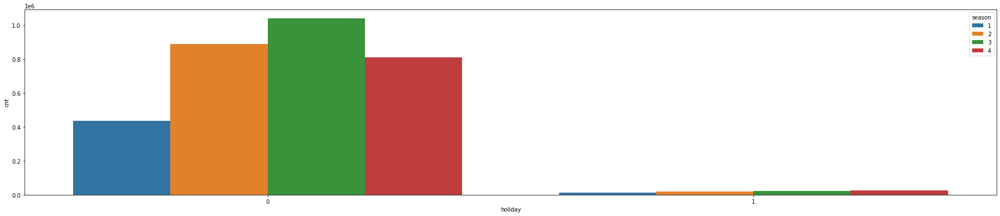

    season  weekday     cnt
0        1        0   58666
1        1        1   61858
2        1        2   69813
3        1        3   60067
4        1        4   66350
5        1        5   69695
6        1        6   59557
7        2        0  129650
8        2        1  114582
9        2        2  123654
10       2        3  130547
11       2        4  135207
12       2        5  135792
13       2        6  138689
14       3        0  138431
15       3        1  146307
16       3        2  152715
17       3        3  158054
18       3        4  159561
19       3        5  155267
20       3        6  150794
21       4        0  111292
22       4        1  122170
23       4        2  121132
24       4        3  119170
25       4        4  114077
26       4        5  122467
27       4        6  122651


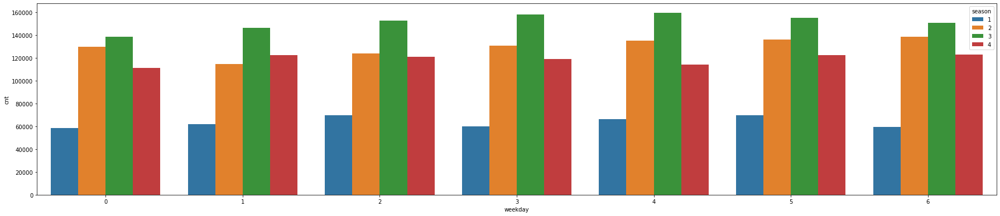

   season  workingday     cnt
0       1           0  130038
1       1           1  315968
2       2           0  287976
3       2           1  620145
4       3           0  312056
5       3           1  749073
6       4           0  258095
7       4           1  574864


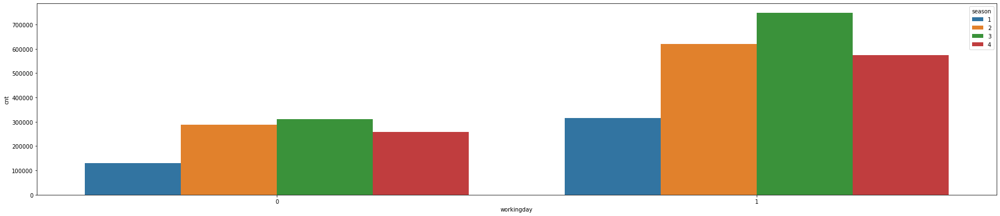

    season  weathersit     cnt
0        1           1  293720
1        1           2  149170
2        1           3    3116
3        2           1  618313
4        2           2  286301
5        2           3    3507
6        3           1  799443
7        3           2  250679
8        3           3   11007
9        4           1  515292
10       4           2  298051
11       4           3   19616


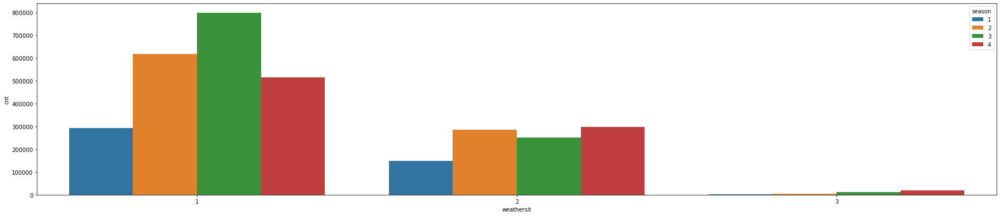

   yr  season     cnt
0   0       1  145829
1   0       2  342406
2   0       3  419650
3   0       4  321942
4   1       1  300177
5   1       2  565715
6   1       3  641479
7   1       4  511017


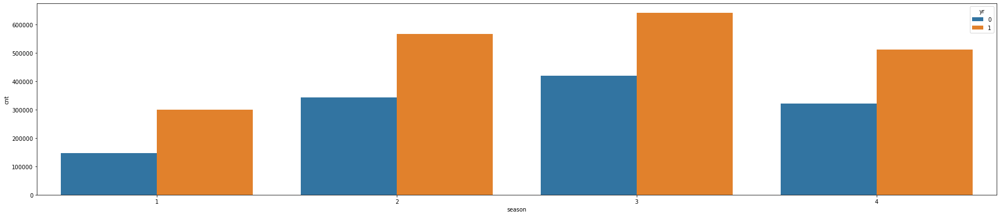

    yr  mnth     cnt
0    0     1   38189
1    0     2   44667
2    0     3   63422
3    0     4   89960
4    0     5  135821
5    0     6  143512
6    0     7  141341
7    0     8  136691
8    0     9  127418
9    0    10  119316
10   0    11  102167
11   0    12   87323
12   1     1   93368
13   1     2   97042
14   1     3  149366
15   1     4  174224
16   1     5  195865
17   1     6  202830
18   1     7  203607
19   1     8  214503
20   1     9  218573
21   1    10  194382
22   1    11  152664
23   1    12  121964


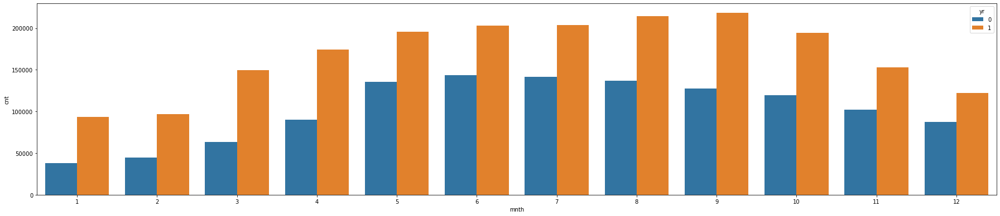

   yr  holiday      cnt
0   0        0  1199805
1   0        1    30022
2   1        0  1969975
3   1        1    48413


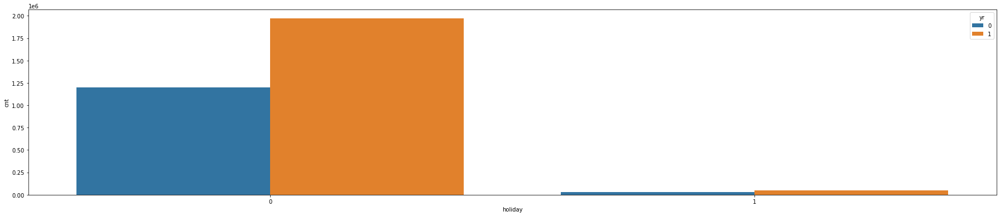

    yr  weekday     cnt
0    0        0  177074
1    0        1  175193
2    0        2  178543
3    0        3  169169
4    0        4  169734
5    0        5  182006
6    0        6  178108
7    1        0  260965
8    1        1  269724
9    1        2  288771
10   1        3  298669
11   1        4  305461
12   1        5  301215
13   1        6  293583


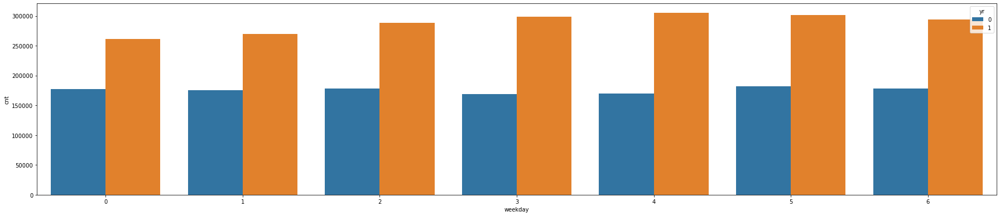

   yr  workingday      cnt
0   0           0   385204
1   0           1   844623
2   1           0   602961
3   1           1  1415427


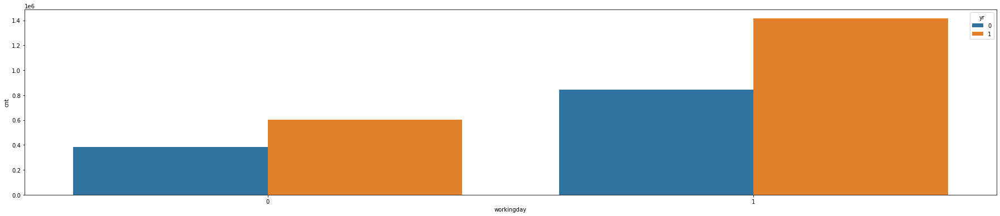

   yr  weathersit      cnt
0   0           1   824209
1   0           2   381129
2   0           3    24489
3   1           1  1402559
4   1           2   603072
5   1           3    12757


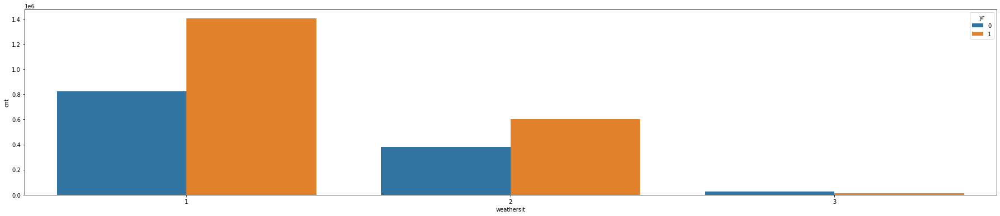

    mnth  season     cnt
0      1       1  131557
1      2       1  141709
2      3       1  131491
3      3       2   81297
4      4       2  264184
5      5       2  331686
6      6       2  230954
7      6       3  115388
8      7       3  344948
9      8       3  351194
10     9       3  249599
11     9       4   96392
12    10       4  313698
13    11       4  254831
14    12       1   41249
15    12       4  168038


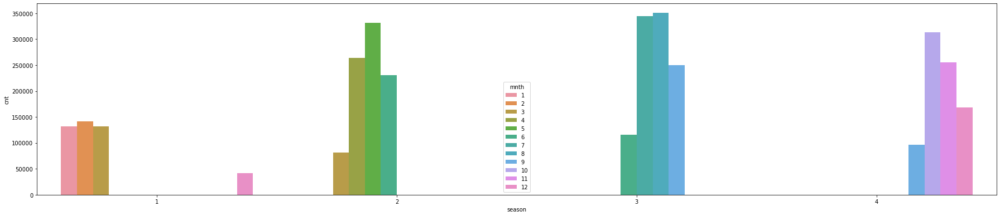

    mnth  yr     cnt
0      1   0   38189
1      1   1   93368
2      2   0   44667
3      2   1   97042
4      3   0   63422
5      3   1  149366
6      4   0   89960
7      4   1  174224
8      5   0  135821
9      5   1  195865
10     6   0  143512
11     6   1  202830
12     7   0  141341
13     7   1  203607
14     8   0  136691
15     8   1  214503
16     9   0  127418
17     9   1  218573
18    10   0  119316
19    10   1  194382
20    11   0  102167
21    11   1  152664
22    12   0   87323
23    12   1  121964


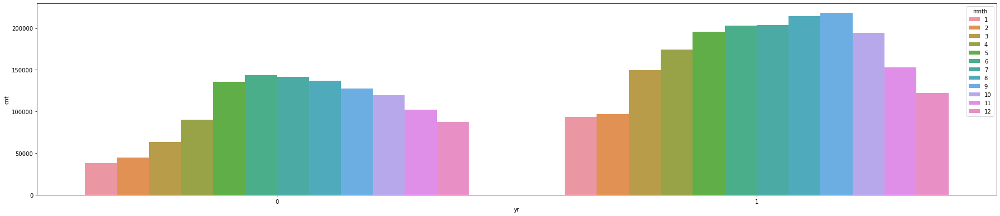

    mnth  holiday     cnt
0      1        0  126308
1      1        1    5249
2      2        0  137473
3      2        1    4236
4      3        0  212788
5      4        0  254688
6      4        1    9496
7      5        0  321545
8      5        1   10141
9      6        0  346342
10     7        0  331502
11     7        1   13446
12     8        0  351194
13     9        0  336606
14     9        1    9385
15    10        0  303103
16    10        1   10595
17    11        0  241274
18    11        1   13557
19    12        0  206957
20    12        1    2330


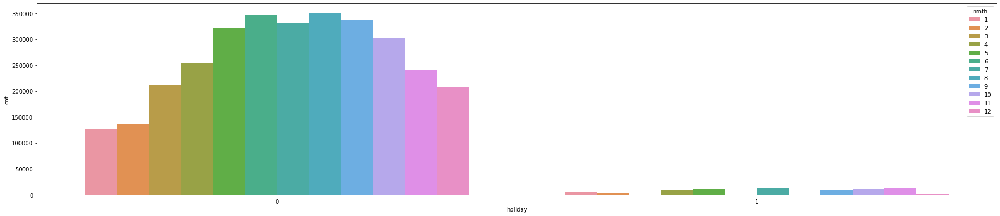

    mnth  weekday    cnt
0      1        0  18159
1      1        1  19268
2      1        2  23110
3      1        3  13733
4      1        4  20106
5      1        5  19572
6      1        6  17609
7      2        0  16451
8      2        1  18922
9      2        2  22592
10     2        3  23486
11     2        4  23028
12     2        5  23465
13     2        6  13765
14     3        0  26408
15     3        1  22807
16     3        2  32166
17     3        3  33030
18     3        4  32165
19     3        5  30763
20     3        6  35449
21     4        0  39752
22     4        1  37527
23     4        2  34652
24     4        3  34647
25     4        4  38112
26     4        5  39483
27     4        6  40011
28     5        0  47882
29     5        1  40611
30     5        2  50250
31     5        3  46073
32     5        4  53034
33     5        5  46008
34     5        6  47828
35     6        0  47523
36     6        1  43826
37     6        2  45447
38     6        3  51309


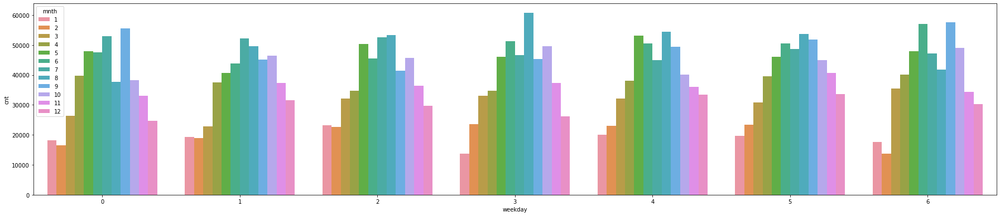

    mnth  workingday     cnt
0      1           0   41017
1      1           1   90540
2      2           0   34452
3      2           1  107257
4      3           0   61857
5      3           1  150931
6      4           0   89259
7      4           1  174925
8      5           0  105851
9      5           1  225835
10     6           0  104617
11     6           1  241725
12     7           0  113518
13     7           1  231430
14     8           0   79415
15     8           1  271779
16     9           0  122364
17     9           1  223627
18    10           0   97756
19    10           1  215942
20    11           0   80870
21    11           1  173961
22    12           0   57189
23    12           1  152098


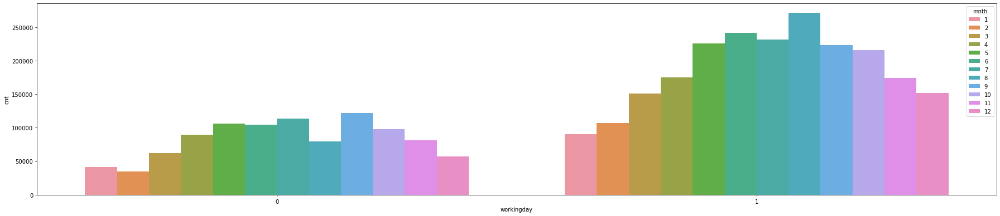

    mnth  weathersit     cnt
0      1           1   84015
1      1           2   47036
2      1           3     506
3      2           1   97239
4      2           2   42301
5      2           3    2169
6      3           1  129049
7      3           2   82054
8      3           3    1685
9      4           1  194034
10     4           2   68328
11     4           3    1822
12     5           1  210838
13     5           2  120848
14     6           1  278830
15     6           2   67512
16     7           1  281366
17     7           2   59123
18     7           3    4459
19     8           1  250921
20     8           2  100273
21     9           1  222200
22     9           2  117243
23     9           3    6548
24    10           1  183302
25    10           2  120268
26    10           3   10128
27    11           1  184625
28    11           2   64017
29    11           3    6189
30    12           1  110349
31    12           2   95198
32    12           3    3740


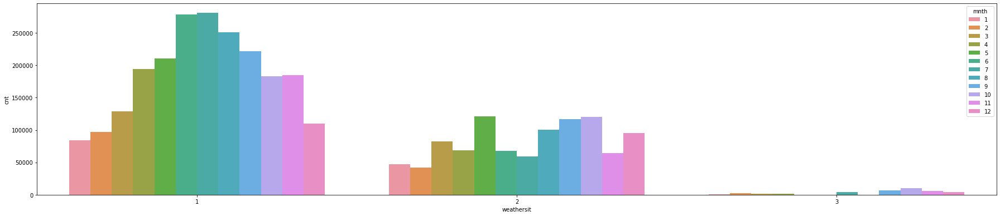

   holiday  season      cnt
0        0       1   434191
1        0       2   888484
2        0       3  1038298
3        0       4   808807
4        1       1    11815
5        1       2    19637
6        1       3    22831
7        1       4    24152


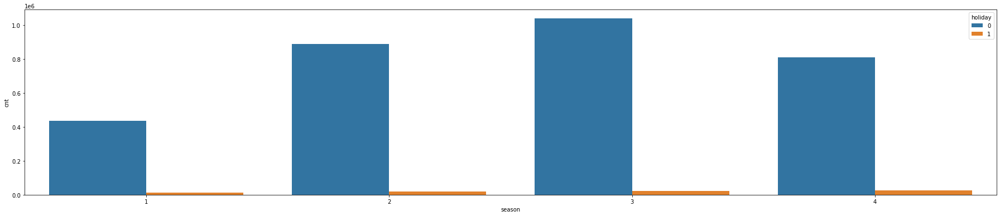

   holiday  yr      cnt
0        0   0  1199805
1        0   1  1969975
2        1   0    30022
3        1   1    48413


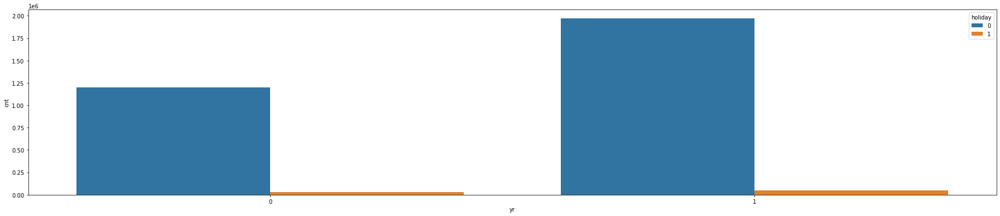

    holiday  mnth     cnt
0         0     1  126308
1         0     2  137473
2         0     3  212788
3         0     4  254688
4         0     5  321545
5         0     6  346342
6         0     7  331502
7         0     8  351194
8         0     9  336606
9         0    10  303103
10        0    11  241274
11        0    12  206957
12        1     1    5249
13        1     2    4236
14        1     4    9496
15        1     5   10141
16        1     7   13446
17        1     9    9385
18        1    10   10595
19        1    11   13557
20        1    12    2330


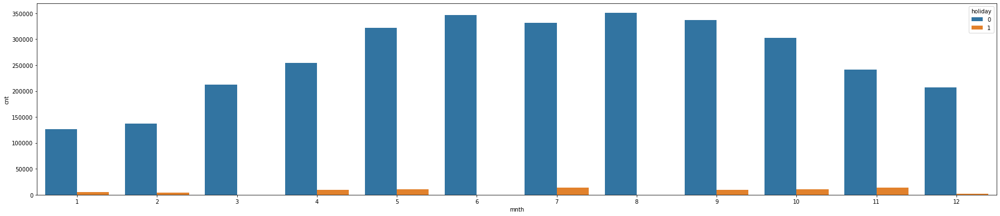

    holiday  weekday     cnt
0         0        0  438039
1         0        1  385312
2         0        2  466301
3         0        3  460435
4         0        4  471275
5         0        5  476727
6         0        6  471691
7         1        1   59605
8         1        2    1013
9         1        3    7403
10        1        4    3920
11        1        5    6494


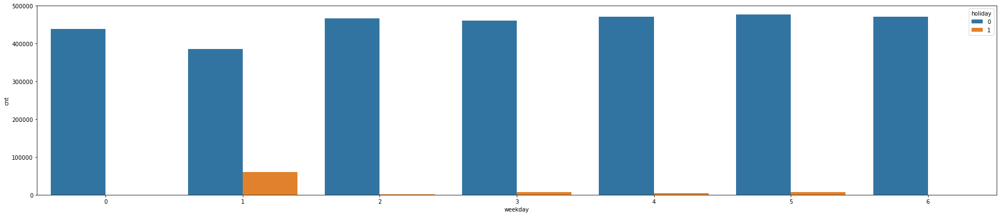

   holiday  workingday      cnt
0        0           0   909730
1        0           1  2260050
2        1           0    78435


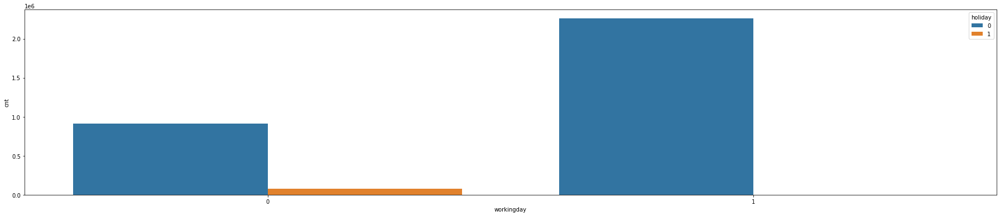

   holiday  weathersit      cnt
0        0           1  2166325
1        0           2   966209
2        0           3    37246
3        1           1    60443
4        1           2    17992


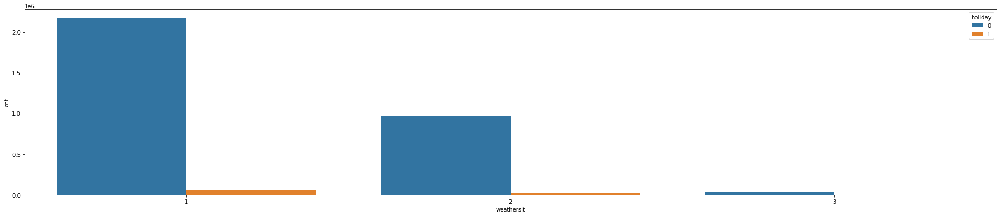

    weekday  season     cnt
0         0       1   58666
1         0       2  129650
2         0       3  138431
3         0       4  111292
4         1       1   61858
5         1       2  114582
6         1       3  146307
7         1       4  122170
8         2       1   69813
9         2       2  123654
10        2       3  152715
11        2       4  121132
12        3       1   60067
13        3       2  130547
14        3       3  158054
15        3       4  119170
16        4       1   66350
17        4       2  135207
18        4       3  159561
19        4       4  114077
20        5       1   69695
21        5       2  135792
22        5       3  155267
23        5       4  122467
24        6       1   59557
25        6       2  138689
26        6       3  150794
27        6       4  122651


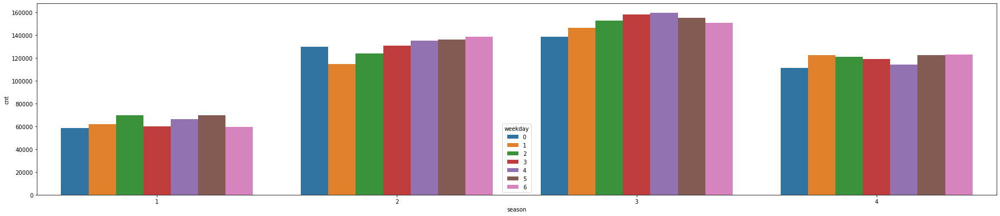

    weekday  yr     cnt
0         0   0  177074
1         0   1  260965
2         1   0  175193
3         1   1  269724
4         2   0  178543
5         2   1  288771
6         3   0  169169
7         3   1  298669
8         4   0  169734
9         4   1  305461
10        5   0  182006
11        5   1  301215
12        6   0  178108
13        6   1  293583


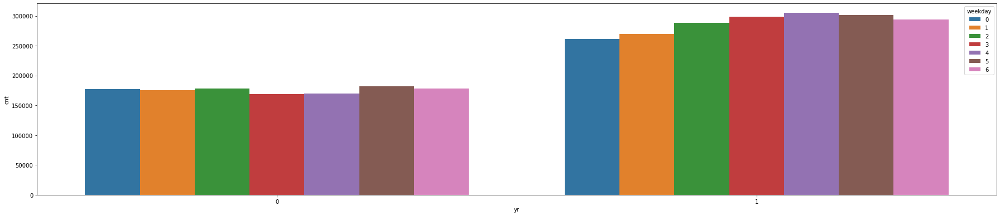

    weekday  mnth    cnt
0         0     1  18159
1         0     2  16451
2         0     3  26408
3         0     4  39752
4         0     5  47882
5         0     6  47523
6         0     7  52981
7         0     8  37624
8         0     9  55436
9         0    10  38155
10        0    11  33009
11        0    12  24659
12        1     1  19268
13        1     2  18922
14        1     3  22807
15        1     4  37527
16        1     5  40611
17        1     6  43826
18        1     7  52124
19        1     8  49665
20        1     9  45097
21        1    10  46324
22        1    11  37267
23        1    12  31479
24        2     1  23110
25        2     2  22592
26        2     3  32166
27        2     4  34652
28        2     5  50250
29        2     6  45447
30        2     7  52598
31        2     8  53374
32        2     9  41476
33        2    10  45581
34        2    11  36362
35        2    12  29706
36        3     1  13733
37        3     2  23486
38        3     3  33030


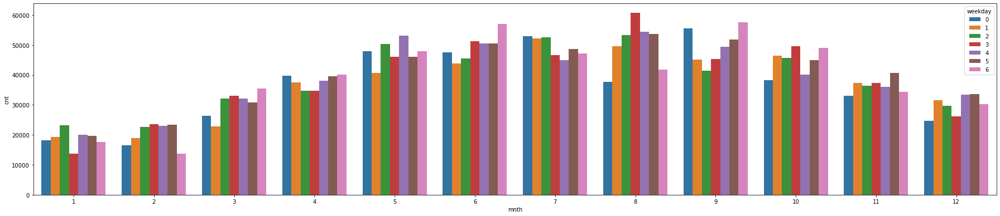

    weekday  holiday     cnt
0         0        0  438039
1         1        0  385312
2         1        1   59605
3         2        0  466301
4         2        1    1013
5         3        0  460435
6         3        1    7403
7         4        0  471275
8         4        1    3920
9         5        0  476727
10        5        1    6494
11        6        0  471691


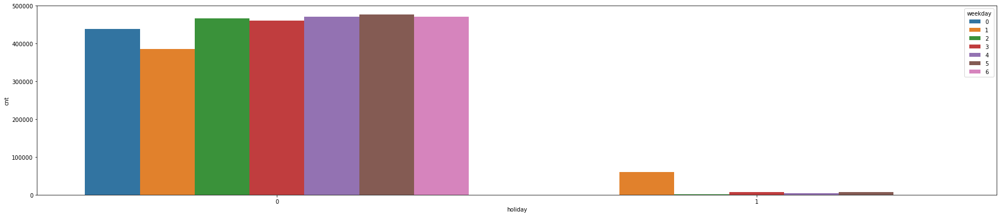

    weekday  workingday     cnt
0         0           0  438039
1         1           0   59605
2         1           1  385312
3         2           0    1013
4         2           1  466301
5         3           0    7403
6         3           1  460435
7         4           0    3920
8         4           1  471275
9         5           0    6494
10        5           1  476727
11        6           0  471691


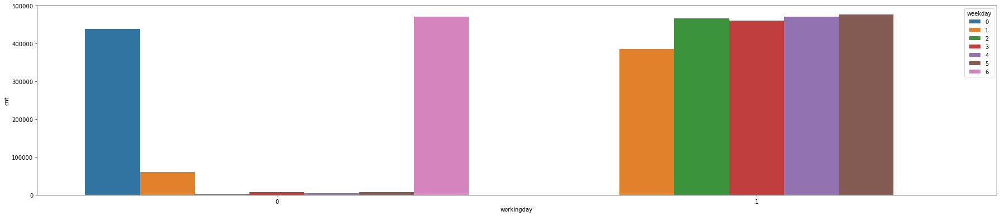

    weekday  weathersit     cnt
0         0           1  320258
1         0           2  116754
2         0           3    1027
3         1           1  285467
4         1           2  156663
5         1           3    2787
6         2           1  309374
7         2           2  146390
8         2           3   11550
9         3           1  338021
10        3           2  119512
11        3           3   10305
12        4           1  326423
13        4           2  145245
14        4           3    3527
15        5           1  319957
16        5           2  163264
17        6           1  327268
18        6           2  136373
19        6           3    8050


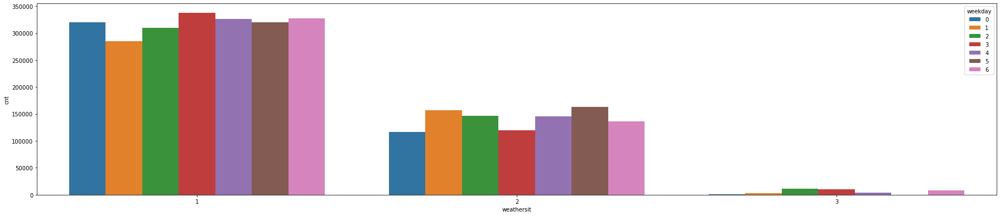

   workingday  season     cnt
0           0       1  130038
1           0       2  287976
2           0       3  312056
3           0       4  258095
4           1       1  315968
5           1       2  620145
6           1       3  749073
7           1       4  574864


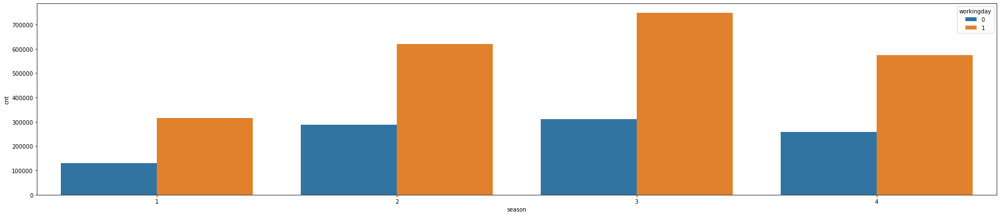

   workingday  yr      cnt
0           0   0   385204
1           0   1   602961
2           1   0   844623
3           1   1  1415427


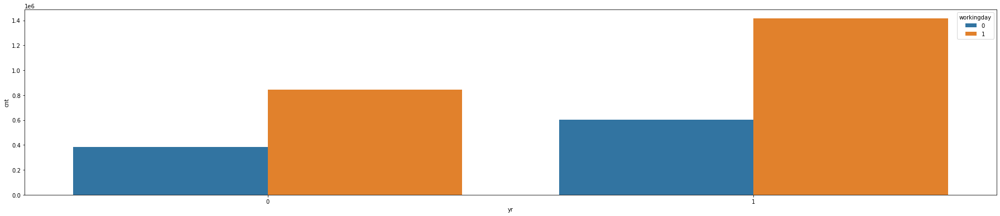

    workingday  mnth     cnt
0            0     1   41017
1            0     2   34452
2            0     3   61857
3            0     4   89259
4            0     5  105851
5            0     6  104617
6            0     7  113518
7            0     8   79415
8            0     9  122364
9            0    10   97756
10           0    11   80870
11           0    12   57189
12           1     1   90540
13           1     2  107257
14           1     3  150931
15           1     4  174925
16           1     5  225835
17           1     6  241725
18           1     7  231430
19           1     8  271779
20           1     9  223627
21           1    10  215942
22           1    11  173961
23           1    12  152098


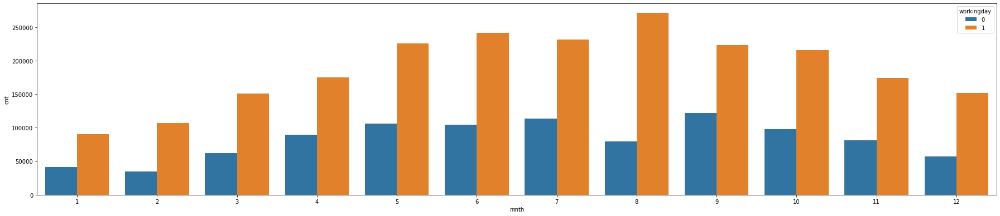

   workingday  holiday      cnt
0           0        0   909730
1           0        1    78435
2           1        0  2260050


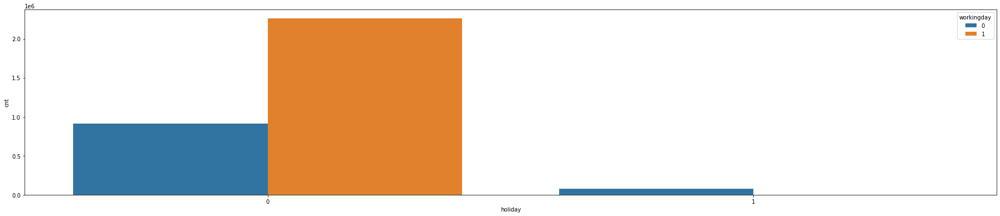

    workingday  weekday     cnt
0            0        0  438039
1            0        1   59605
2            0        2    1013
3            0        3    7403
4            0        4    3920
5            0        5    6494
6            0        6  471691
7            1        1  385312
8            1        2  466301
9            1        3  460435
10           1        4  471275
11           1        5  476727


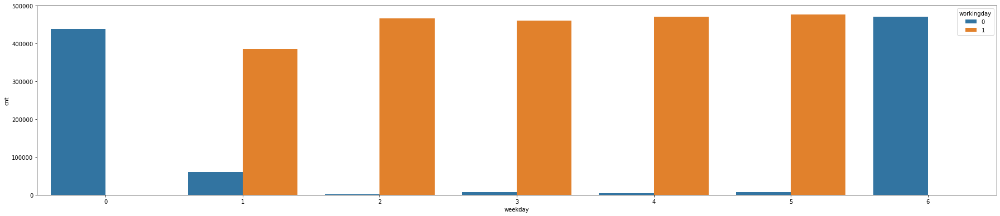

   workingday  weathersit      cnt
0           0           1   707969
1           0           2   271119
2           0           3     9077
3           1           1  1518799
4           1           2   713082
5           1           3    28169


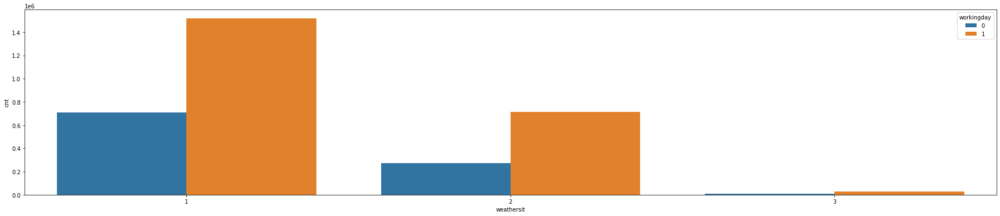

    weathersit  season     cnt
0            1       1  293720
1            1       2  618313
2            1       3  799443
3            1       4  515292
4            2       1  149170
5            2       2  286301
6            2       3  250679
7            2       4  298051
8            3       1    3116
9            3       2    3507
10           3       3   11007
11           3       4   19616


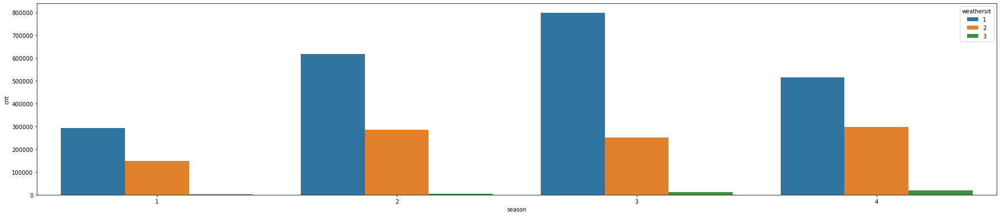

   weathersit  yr      cnt
0           1   0   824209
1           1   1  1402559
2           2   0   381129
3           2   1   603072
4           3   0    24489
5           3   1    12757


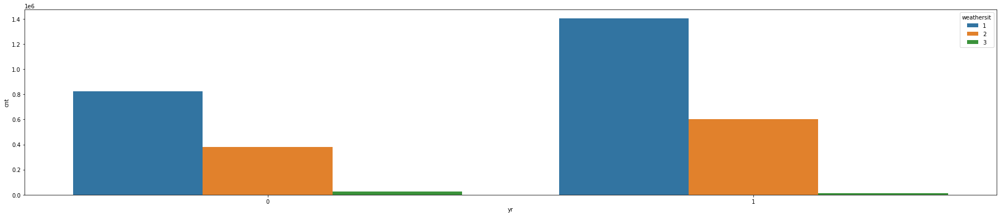

    weathersit  mnth     cnt
0            1     1   84015
1            1     2   97239
2            1     3  129049
3            1     4  194034
4            1     5  210838
5            1     6  278830
6            1     7  281366
7            1     8  250921
8            1     9  222200
9            1    10  183302
10           1    11  184625
11           1    12  110349
12           2     1   47036
13           2     2   42301
14           2     3   82054
15           2     4   68328
16           2     5  120848
17           2     6   67512
18           2     7   59123
19           2     8  100273
20           2     9  117243
21           2    10  120268
22           2    11   64017
23           2    12   95198
24           3     1     506
25           3     2    2169
26           3     3    1685
27           3     4    1822
28           3     7    4459
29           3     9    6548
30           3    10   10128
31           3    11    6189
32           3    12    3740


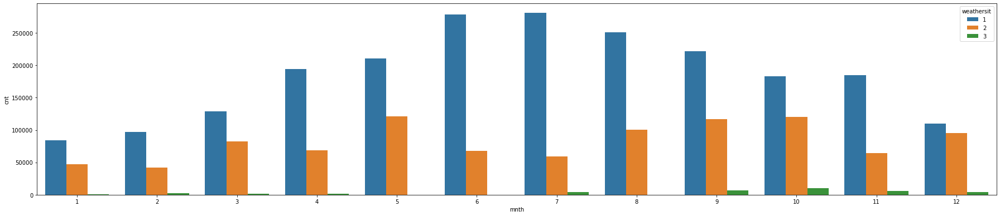

   weathersit  holiday      cnt
0           1        0  2166325
1           1        1    60443
2           2        0   966209
3           2        1    17992
4           3        0    37246


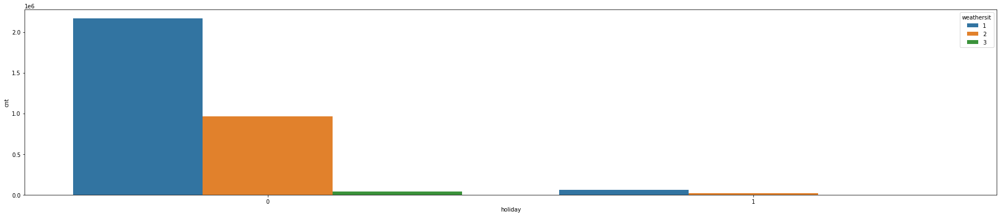

    weathersit  weekday     cnt
0            1        0  320258
1            1        1  285467
2            1        2  309374
3            1        3  338021
4            1        4  326423
5            1        5  319957
6            1        6  327268
7            2        0  116754
8            2        1  156663
9            2        2  146390
10           2        3  119512
11           2        4  145245
12           2        5  163264
13           2        6  136373
14           3        0    1027
15           3        1    2787
16           3        2   11550
17           3        3   10305
18           3        4    3527
19           3        6    8050


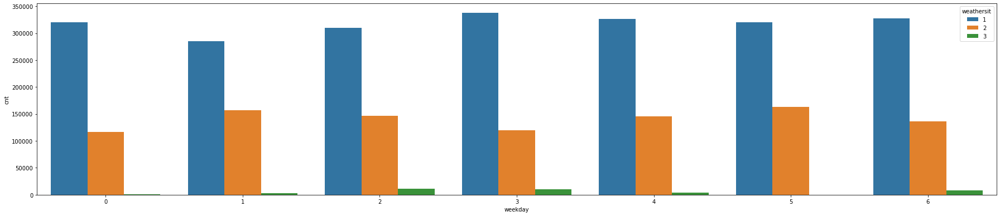

   weathersit  workingday      cnt
0           1           0   707969
1           1           1  1518799
2           2           0   271119
3           2           1   713082
4           3           0     9077
5           3           1    28169


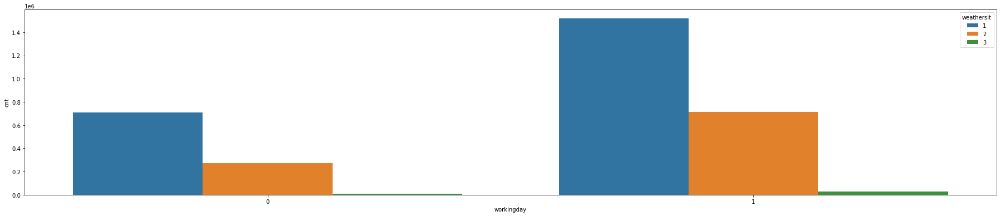

In [132]:
for j in cat_variables:
    for i in cat_variables:
        if i != j:
            sns.countplot()
            b = day.filter([i,j,'cnt'])
            group_1 = b.groupby([j,i]).sum()
            group_1 = group_1.reset_index()
            print(group_1)
            
            g=sns.barplot(x=i,y='cnt',data=group_1,estimator= np.sum,hue = j)
        

            plt.show()

### Listing out the numerical columns.  

In [133]:
count_variables = ["temp","atemp","hum","windspeed","cnt","casual","registered"]

### Scatter plot between the numrical variables having categorical valriables in hue

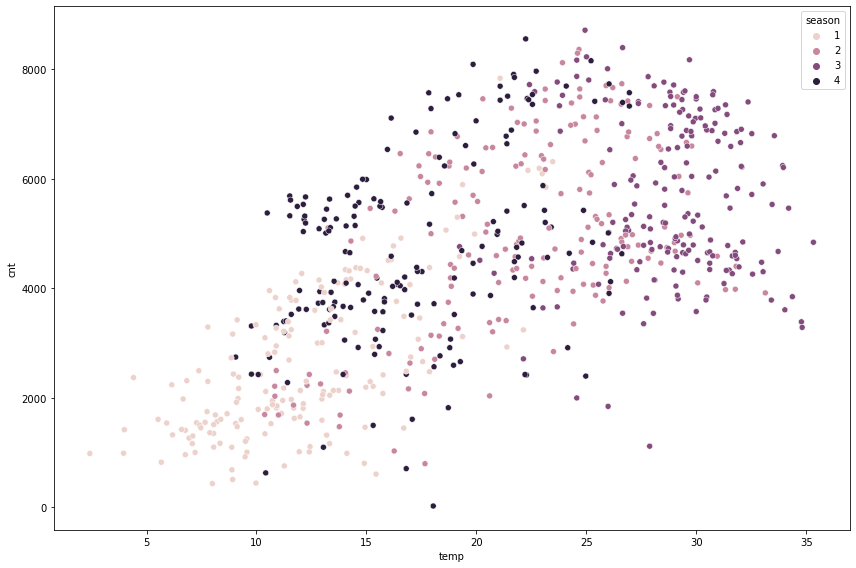

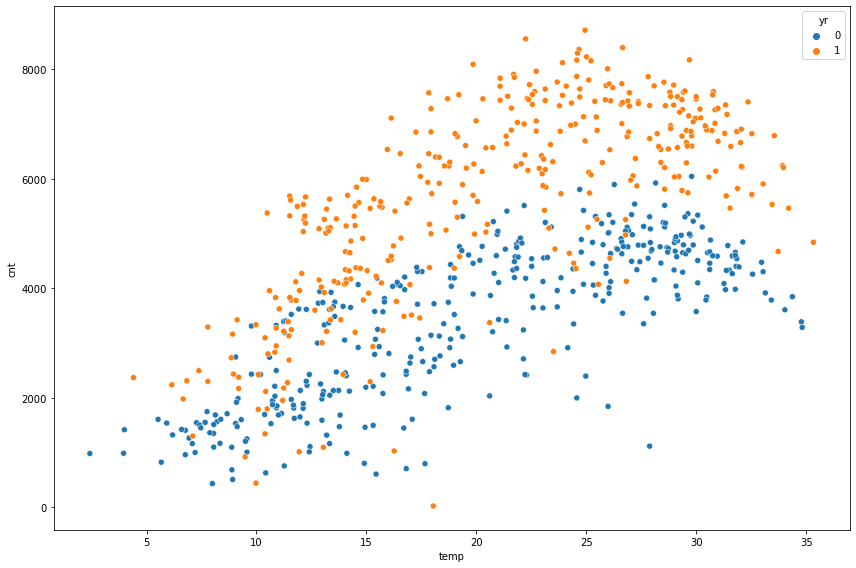

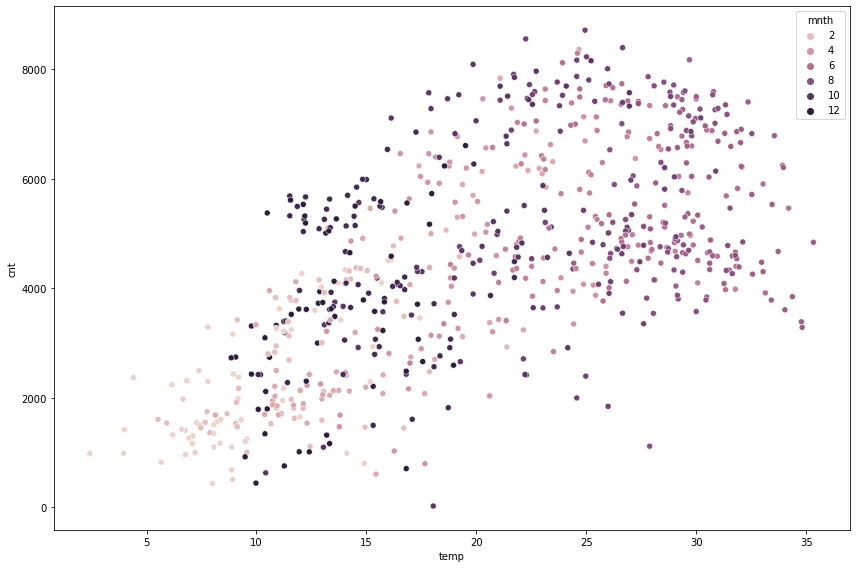

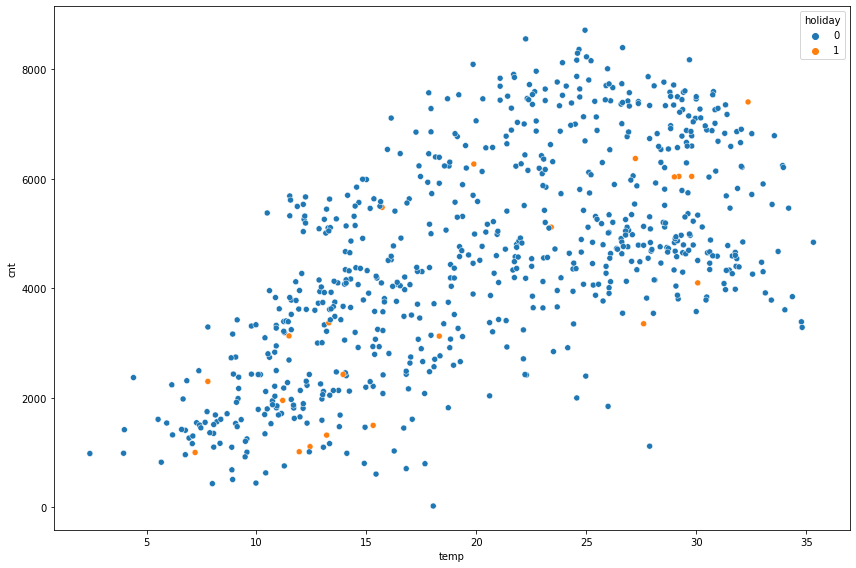

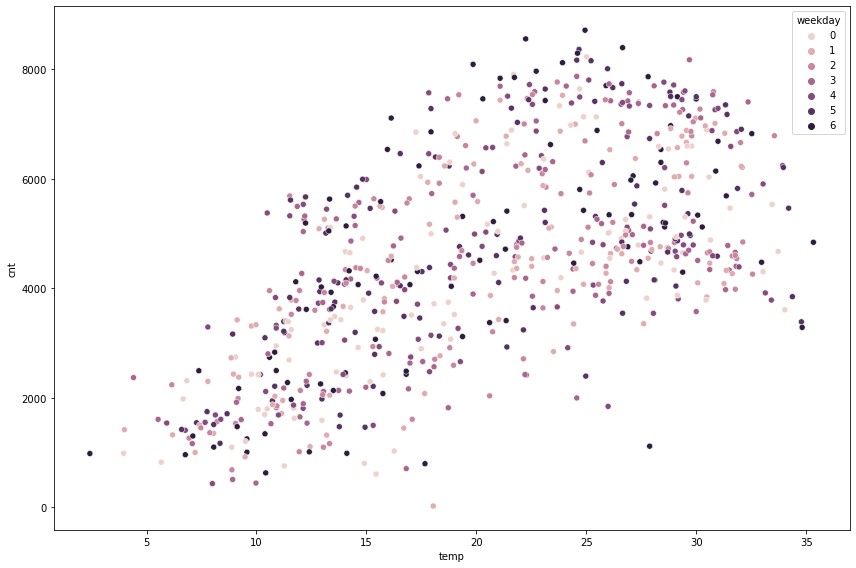

...

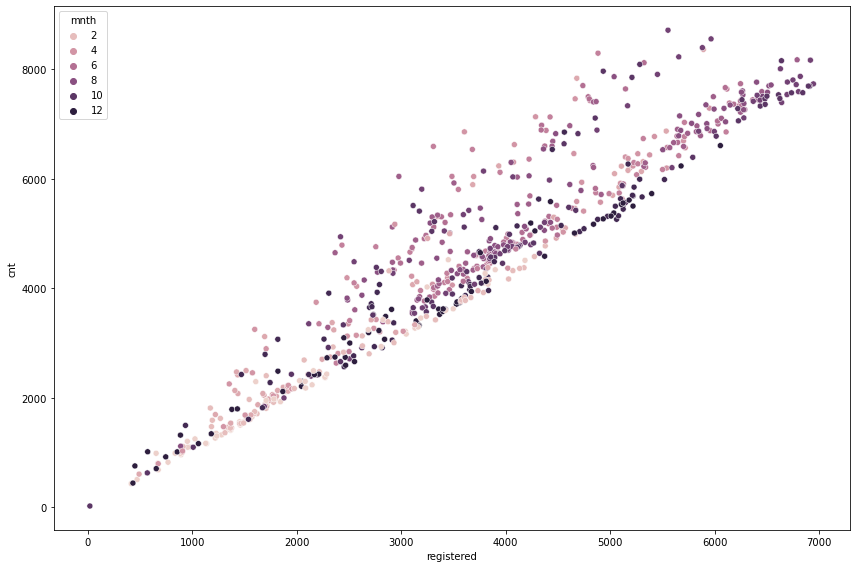

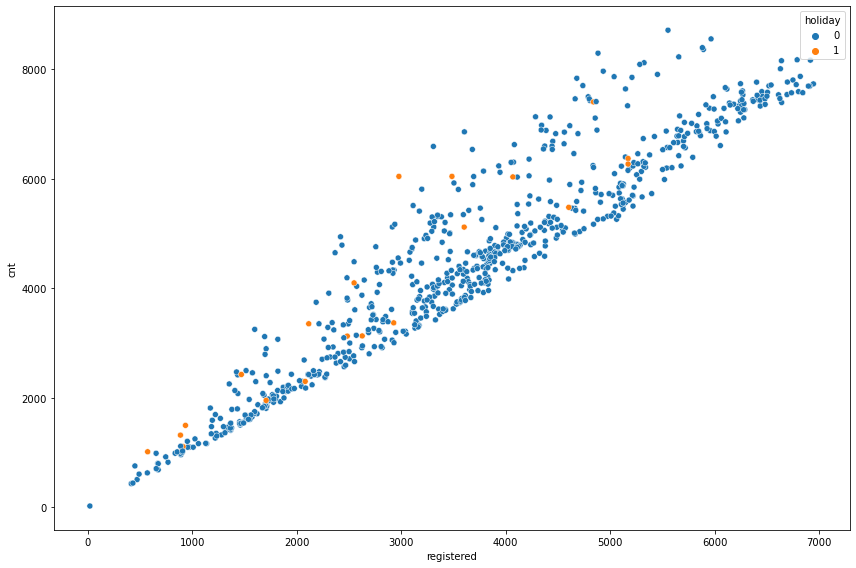

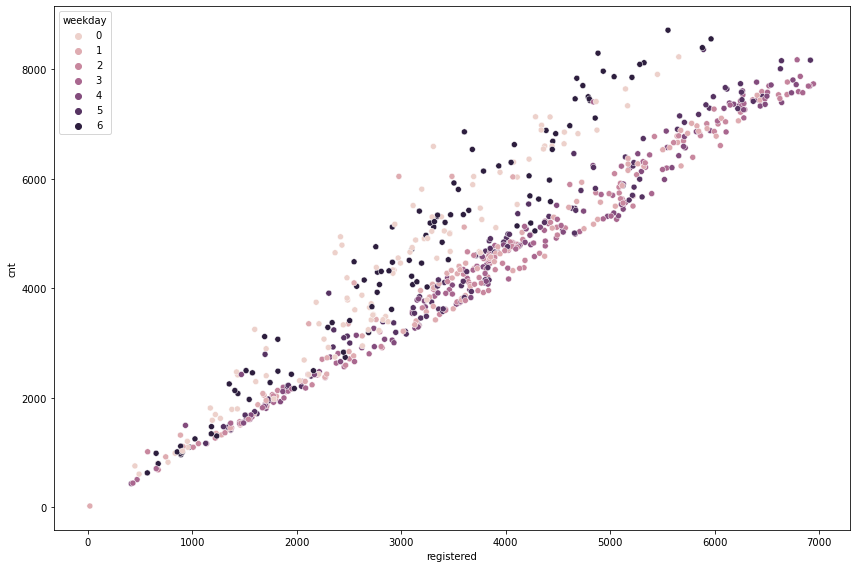

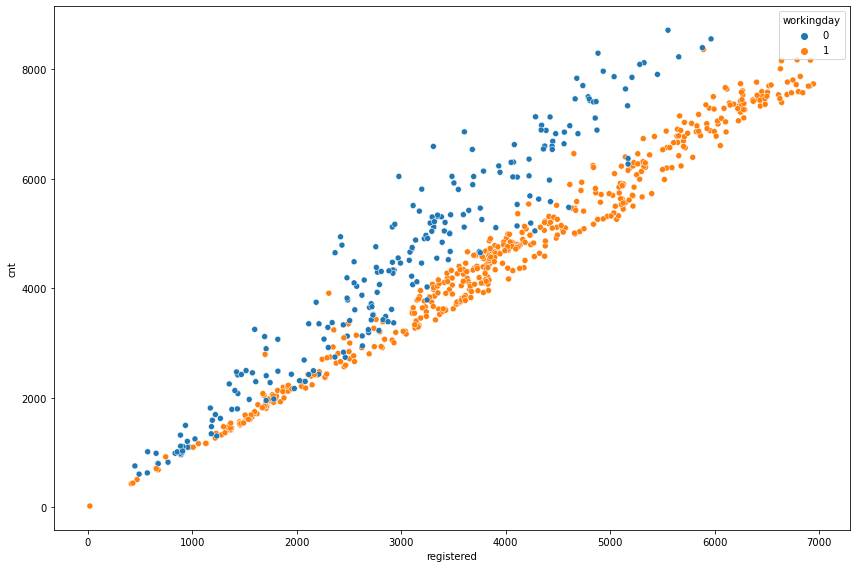

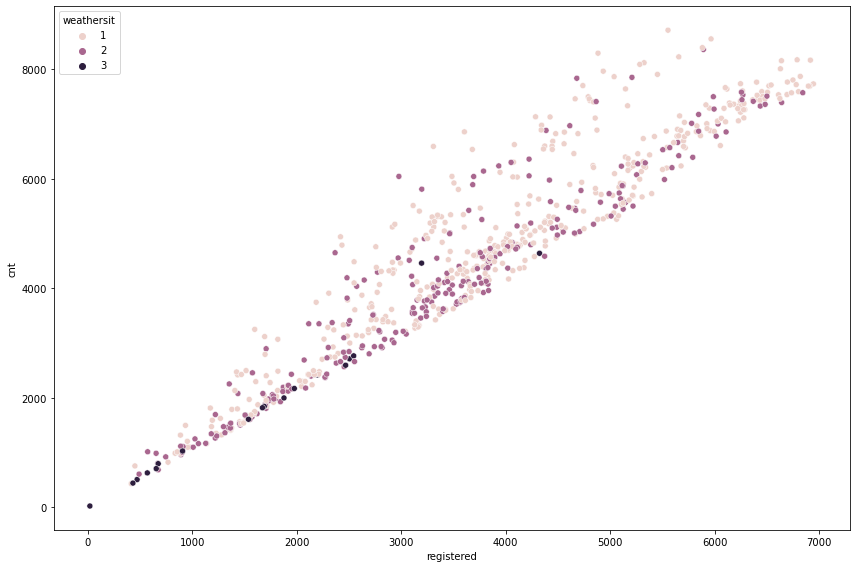

In [134]:
for j in count_variables:
    for i in cat_variables:
        if i != j:
            plt.figure(figsize=(12,8))
            sns.scatterplot(y = day.cnt,x = day[j],hue=day[i])
            plt.show()

### Creating lmplot between numrical variables to see the trend and correlation of each of them with each other.

<Figure size 864x576 with 0 Axes>

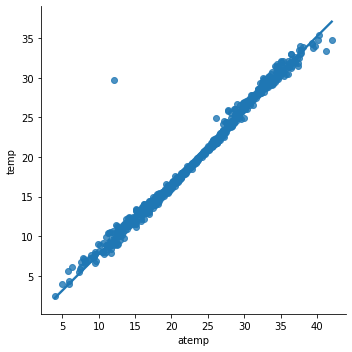

<Figure size 864x576 with 0 Axes>

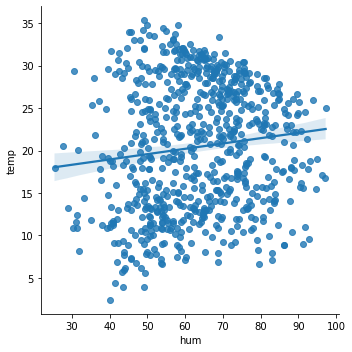

<Figure size 864x576 with 0 Axes>

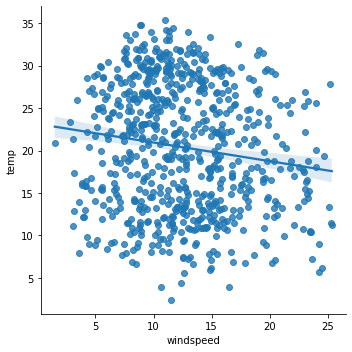

<Figure size 864x576 with 0 Axes>

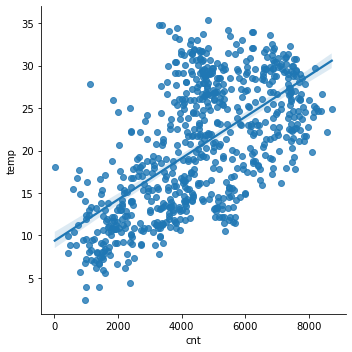

<Figure size 864x576 with 0 Axes>

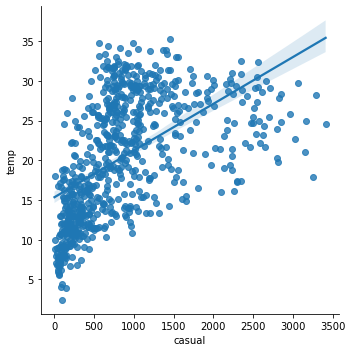

<Figure size 864x576 with 0 Axes>

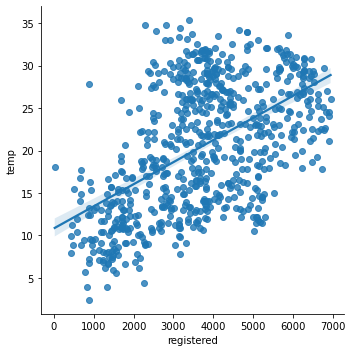

<Figure size 864x576 with 0 Axes>

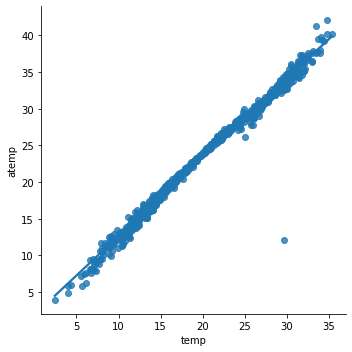

<Figure size 864x576 with 0 Axes>

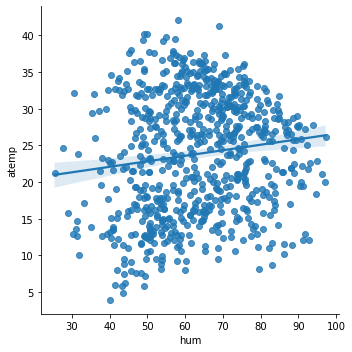

<Figure size 864x576 with 0 Axes>

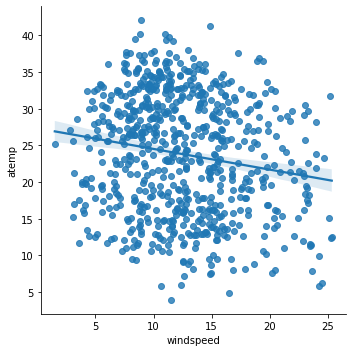

<Figure size 864x576 with 0 Axes>

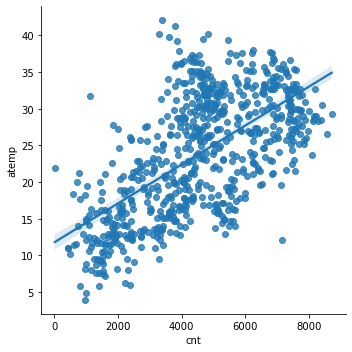

<Figure size 864x576 with 0 Axes>

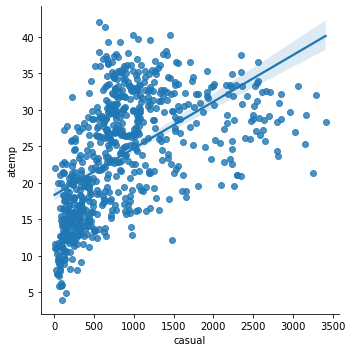

<Figure size 864x576 with 0 Axes>

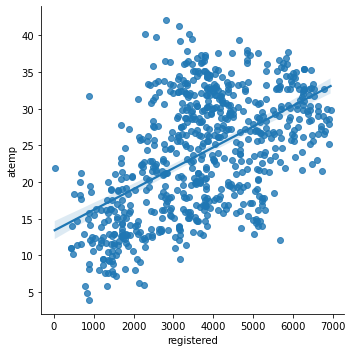

<Figure size 864x576 with 0 Axes>

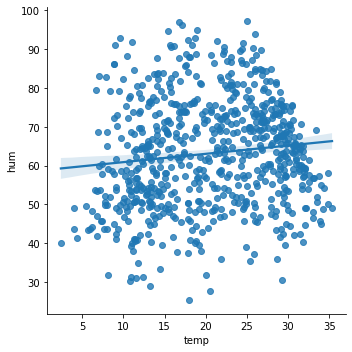

<Figure size 864x576 with 0 Axes>

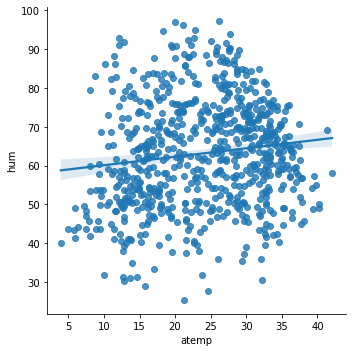

<Figure size 864x576 with 0 Axes>

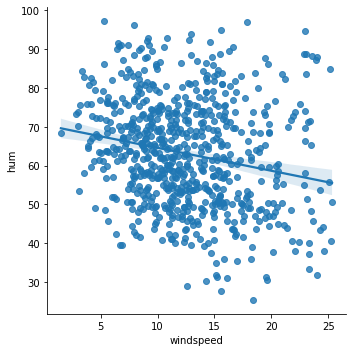

<Figure size 864x576 with 0 Axes>

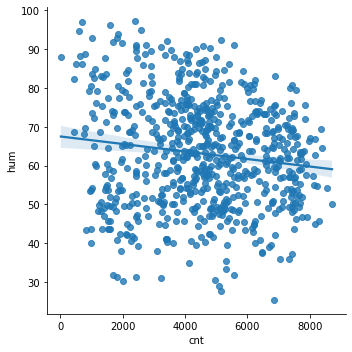

<Figure size 864x576 with 0 Axes>

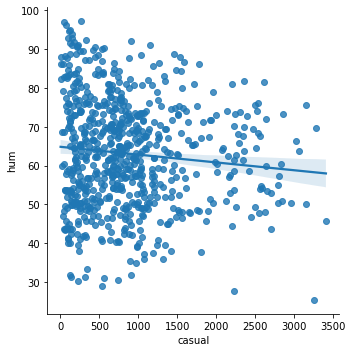

<Figure size 864x576 with 0 Axes>

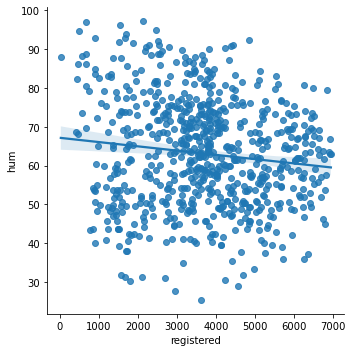

<Figure size 864x576 with 0 Axes>

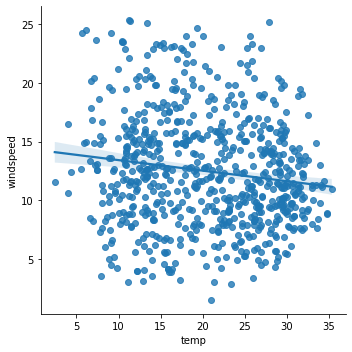

<Figure size 864x576 with 0 Axes>

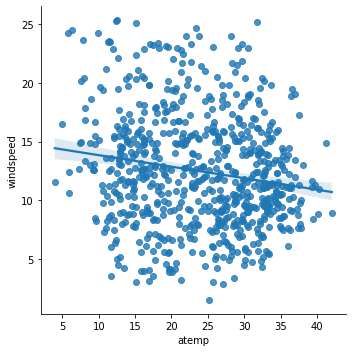

<Figure size 864x576 with 0 Axes>

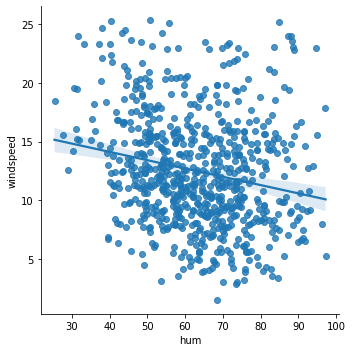

<Figure size 864x576 with 0 Axes>

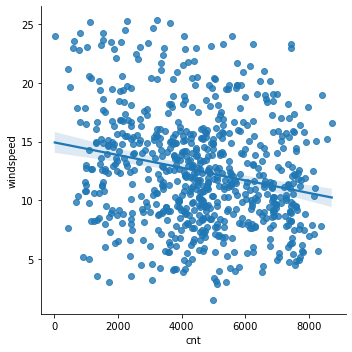

<Figure size 864x576 with 0 Axes>

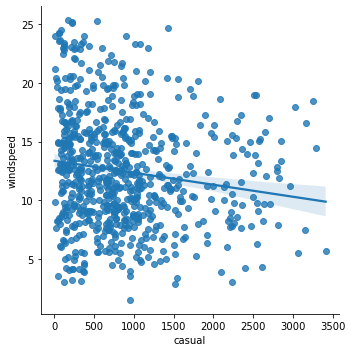

<Figure size 864x576 with 0 Axes>

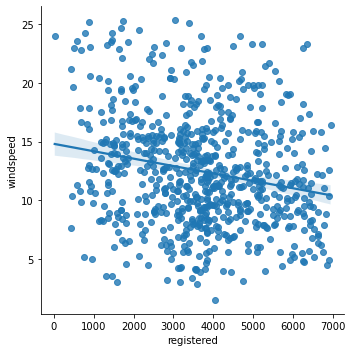

<Figure size 864x576 with 0 Axes>

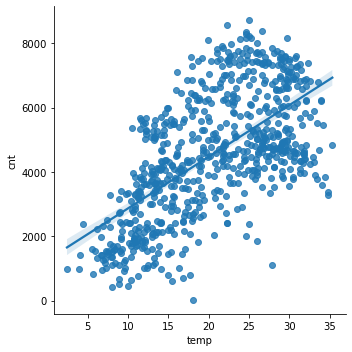

<Figure size 864x576 with 0 Axes>

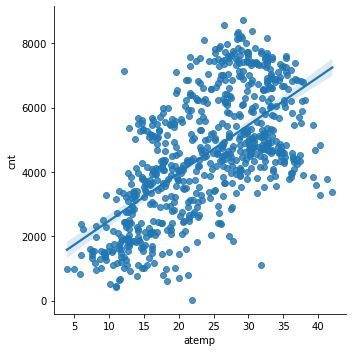

<Figure size 864x576 with 0 Axes>

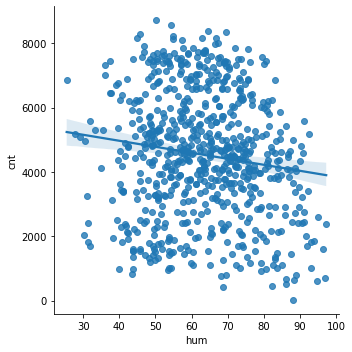

<Figure size 864x576 with 0 Axes>

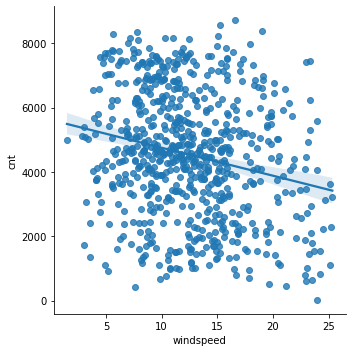

<Figure size 864x576 with 0 Axes>

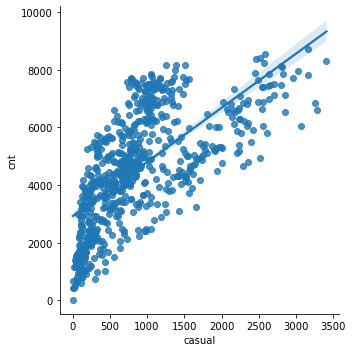

<Figure size 864x576 with 0 Axes>

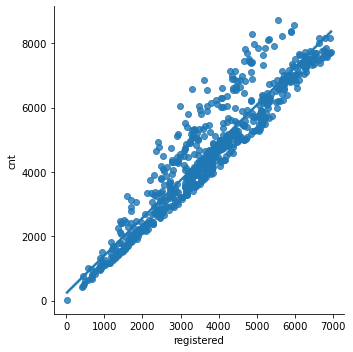

<Figure size 864x576 with 0 Axes>

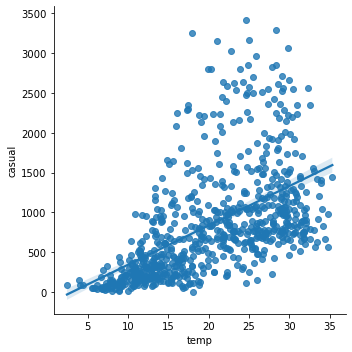

<Figure size 864x576 with 0 Axes>

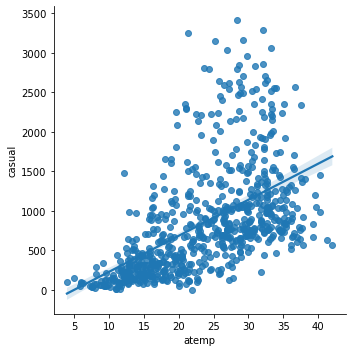

<Figure size 864x576 with 0 Axes>

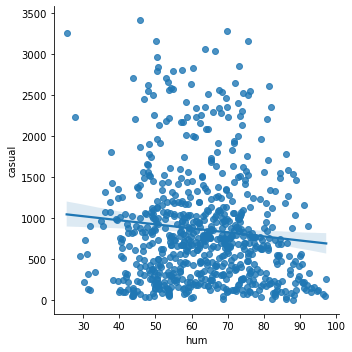

<Figure size 864x576 with 0 Axes>

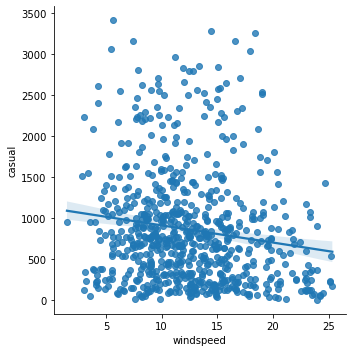

<Figure size 864x576 with 0 Axes>

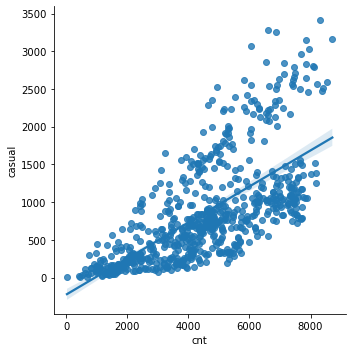

<Figure size 864x576 with 0 Axes>

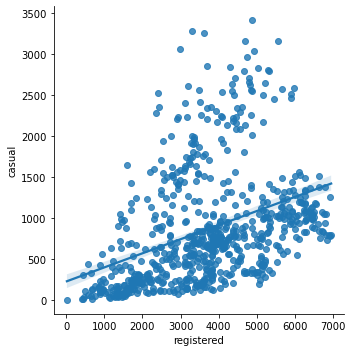

<Figure size 864x576 with 0 Axes>

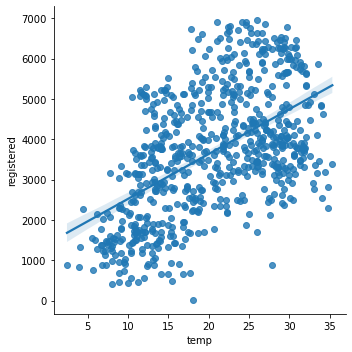

<Figure size 864x576 with 0 Axes>

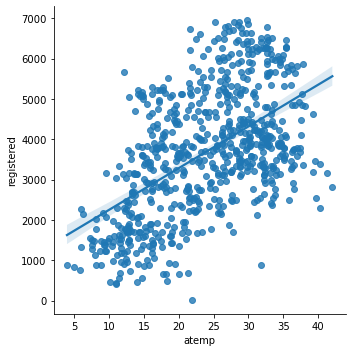

<Figure size 864x576 with 0 Axes>

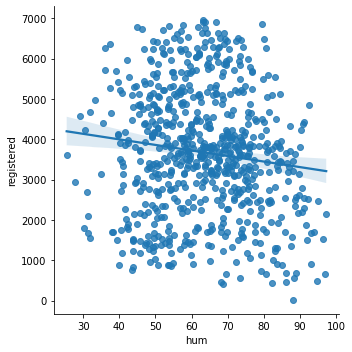

<Figure size 864x576 with 0 Axes>

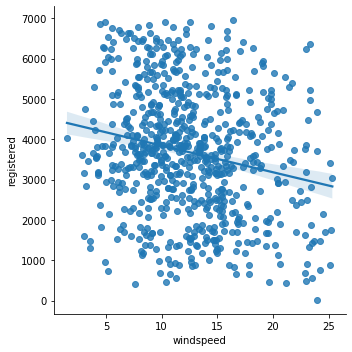

<Figure size 864x576 with 0 Axes>

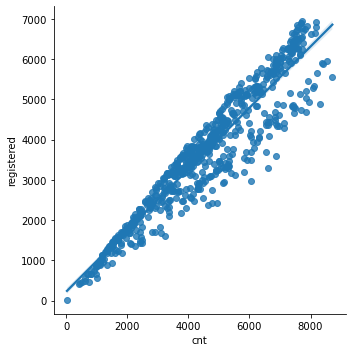

<Figure size 864x576 with 0 Axes>

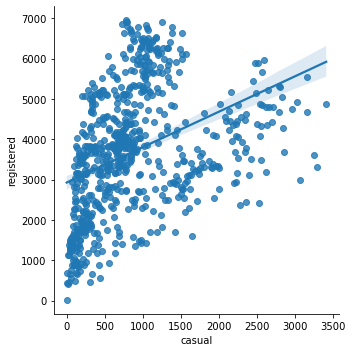

In [135]:
for j in count_variables:
    for i in count_variables:
        if i != j:
            plt.figure(figsize=(12,8))
            sns.lmplot(x=i,y=j,data=day)

### Creating lmplot between numrical variables  having categorical values in hue to see the trend and correlation of each of them with each category.

<Figure size 864x576 with 0 Axes>

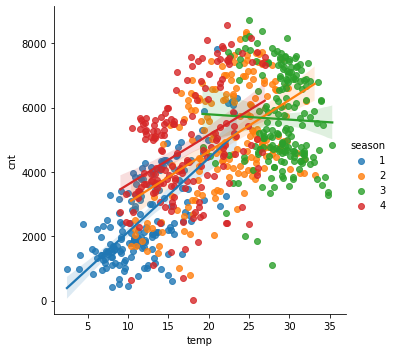

<Figure size 864x576 with 0 Axes>

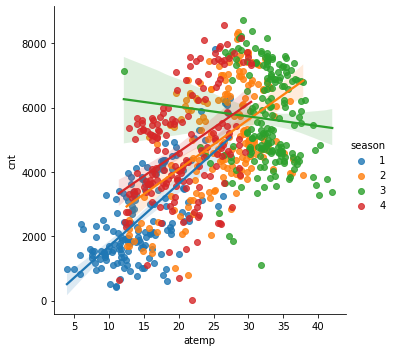

<Figure size 864x576 with 0 Axes>

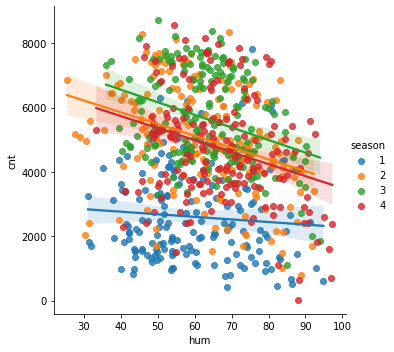

<Figure size 864x576 with 0 Axes>

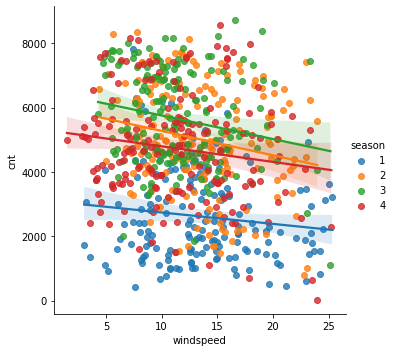

<Figure size 864x576 with 0 Axes>

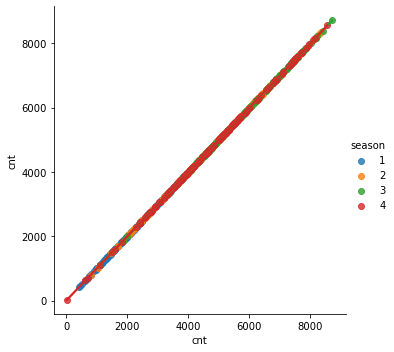

<Figure size 864x576 with 0 Axes>

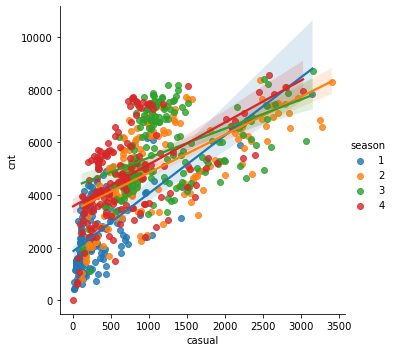

<Figure size 864x576 with 0 Axes>

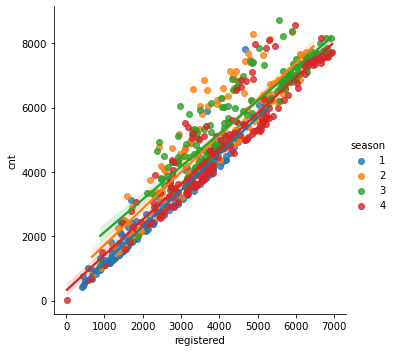

<Figure size 864x576 with 0 Axes>

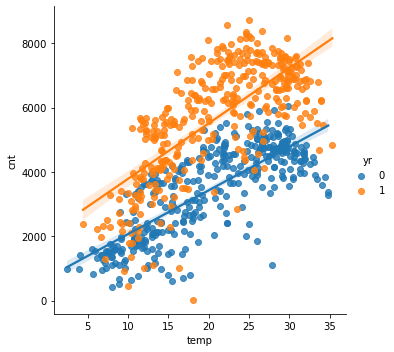

<Figure size 864x576 with 0 Axes>

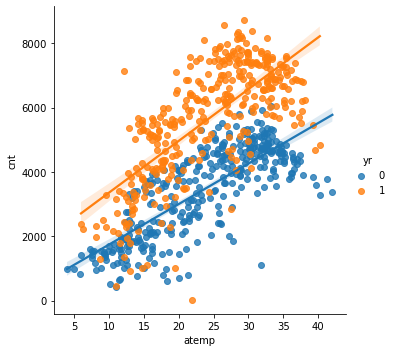

<Figure size 864x576 with 0 Axes>

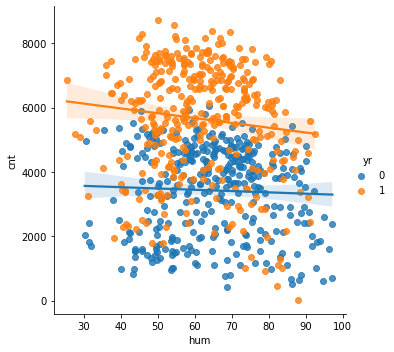

<Figure size 864x576 with 0 Axes>

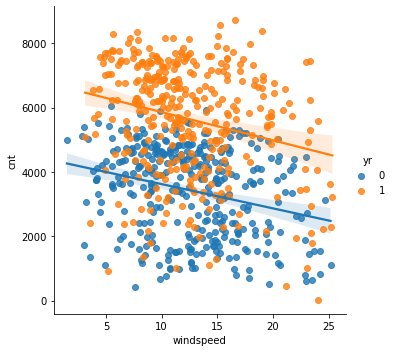

<Figure size 864x576 with 0 Axes>

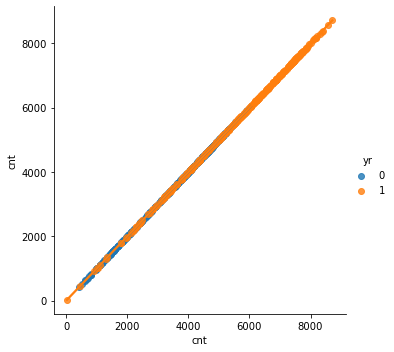

<Figure size 864x576 with 0 Axes>

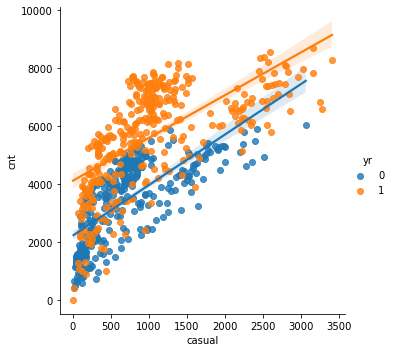

<Figure size 864x576 with 0 Axes>

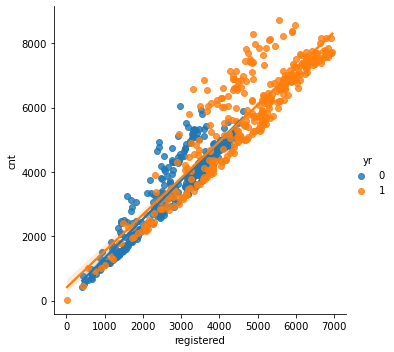

<Figure size 864x576 with 0 Axes>

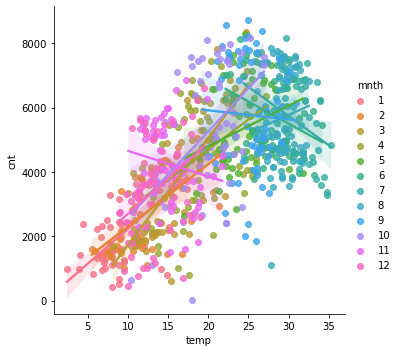

<Figure size 864x576 with 0 Axes>

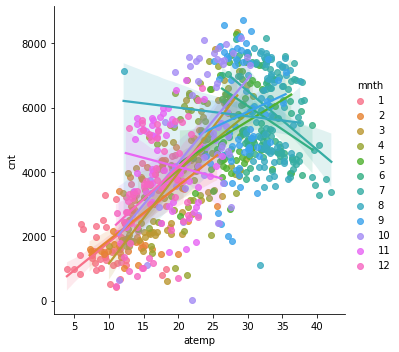

<Figure size 864x576 with 0 Axes>

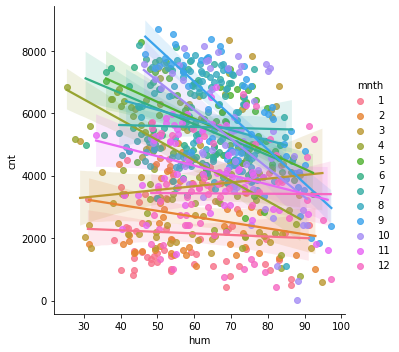

<Figure size 864x576 with 0 Axes>

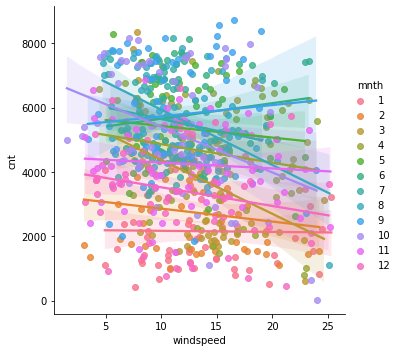

<Figure size 864x576 with 0 Axes>

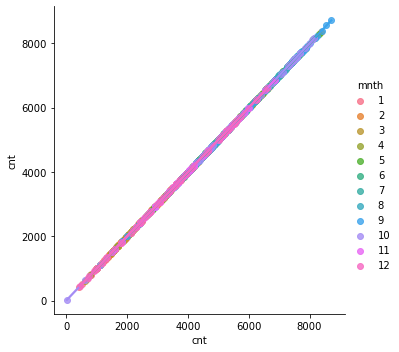

<Figure size 864x576 with 0 Axes>

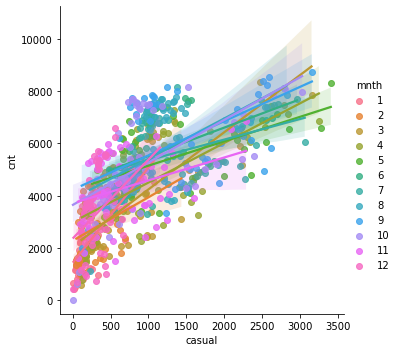

<Figure size 864x576 with 0 Axes>

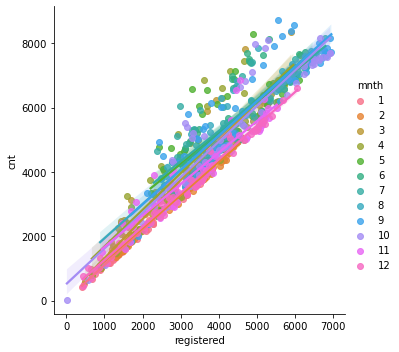

<Figure size 864x576 with 0 Axes>

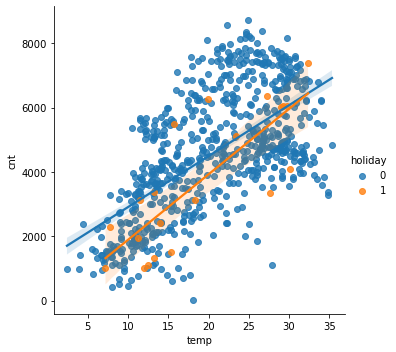

<Figure size 864x576 with 0 Axes>

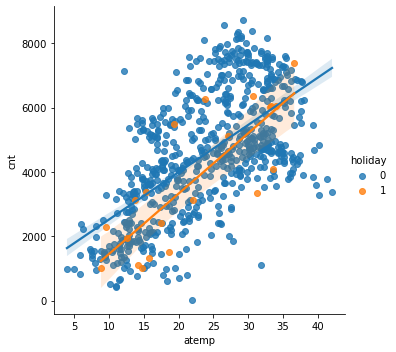

<Figure size 864x576 with 0 Axes>

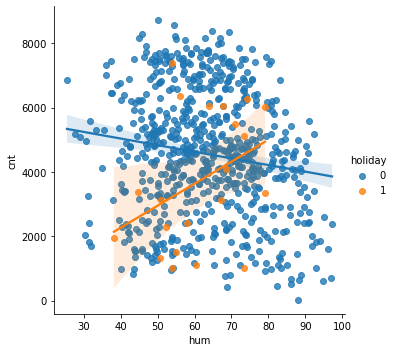

<Figure size 864x576 with 0 Axes>

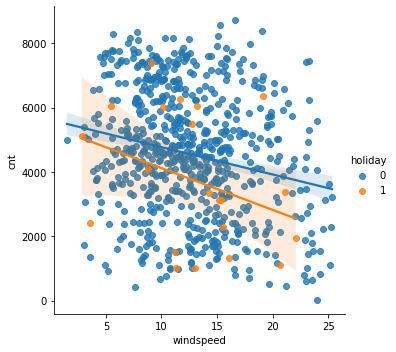

<Figure size 864x576 with 0 Axes>

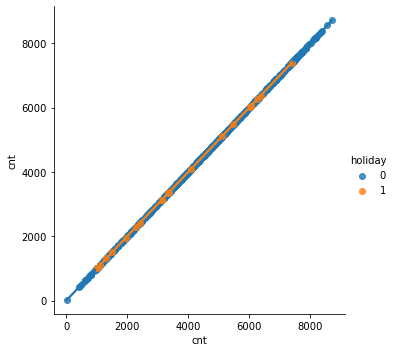

<Figure size 864x576 with 0 Axes>

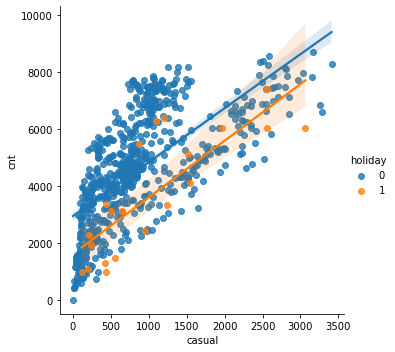

<Figure size 864x576 with 0 Axes>

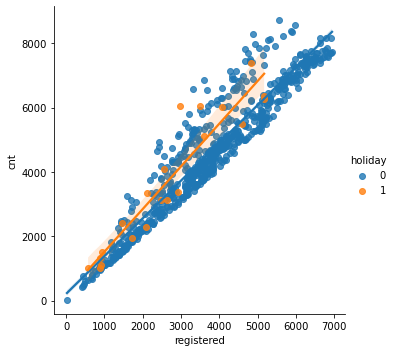

<Figure size 864x576 with 0 Axes>

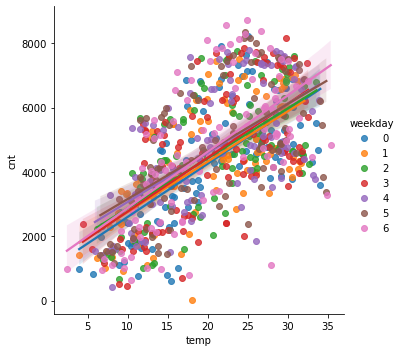

<Figure size 864x576 with 0 Axes>

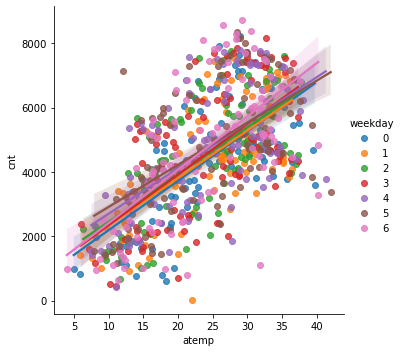

<Figure size 864x576 with 0 Axes>

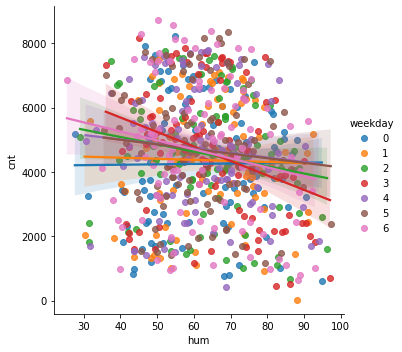

<Figure size 864x576 with 0 Axes>

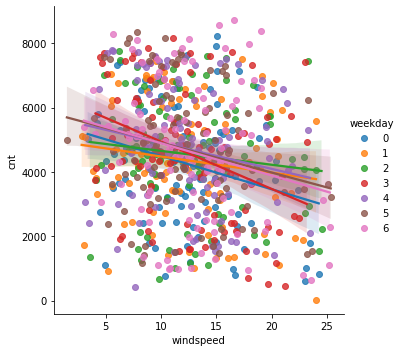

<Figure size 864x576 with 0 Axes>

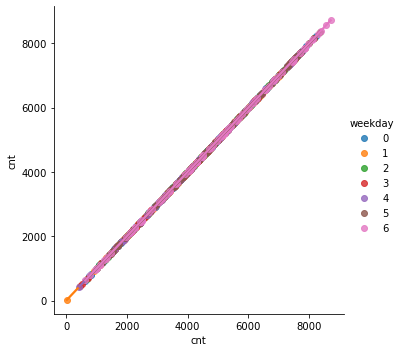

<Figure size 864x576 with 0 Axes>

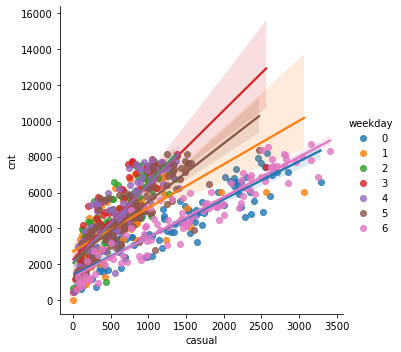

<Figure size 864x576 with 0 Axes>

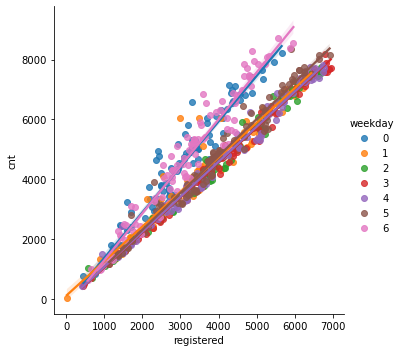

<Figure size 864x576 with 0 Axes>

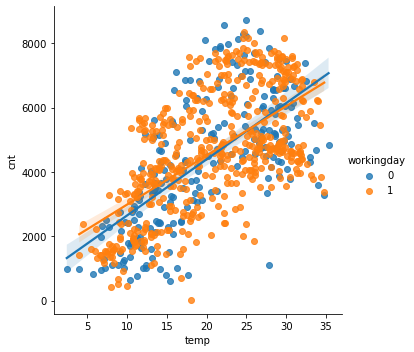

<Figure size 864x576 with 0 Axes>

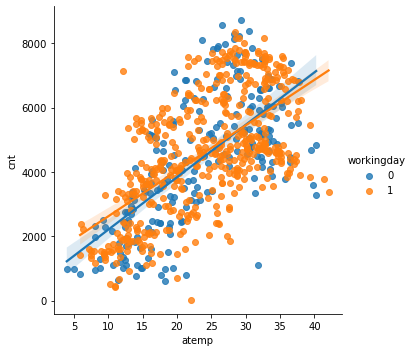

<Figure size 864x576 with 0 Axes>

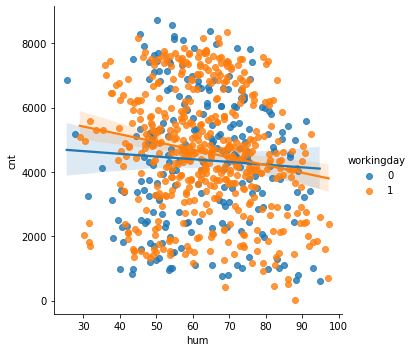

<Figure size 864x576 with 0 Axes>

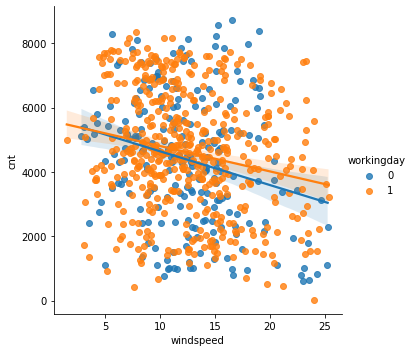

<Figure size 864x576 with 0 Axes>

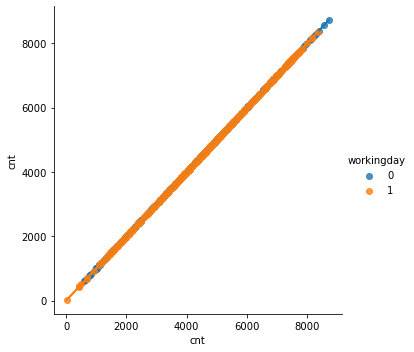

<Figure size 864x576 with 0 Axes>

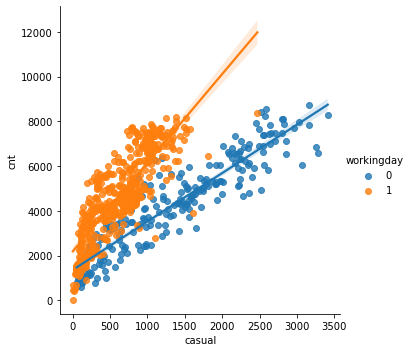

<Figure size 864x576 with 0 Axes>

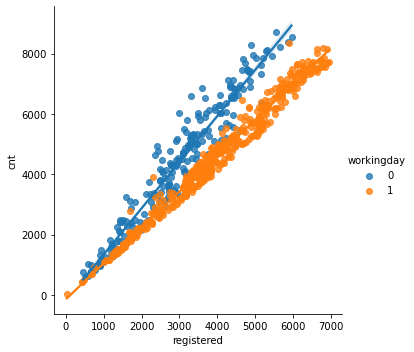

<Figure size 864x576 with 0 Axes>

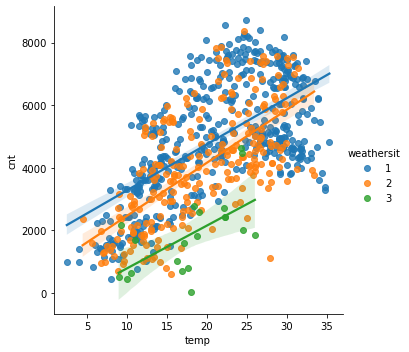

<Figure size 864x576 with 0 Axes>

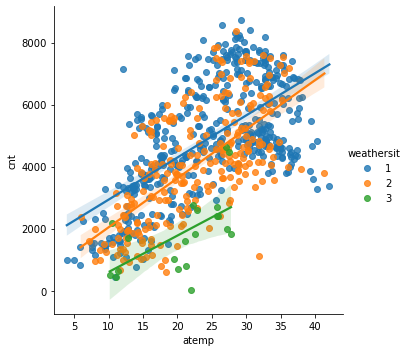

<Figure size 864x576 with 0 Axes>

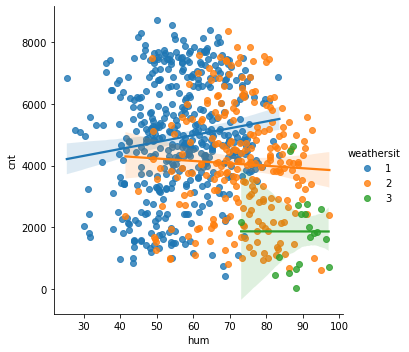

<Figure size 864x576 with 0 Axes>

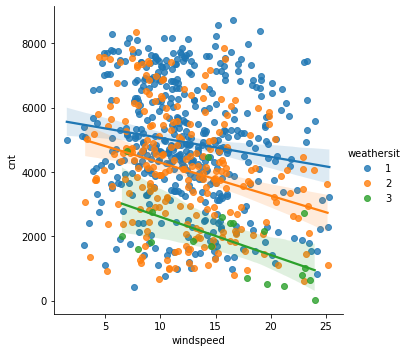

<Figure size 864x576 with 0 Axes>

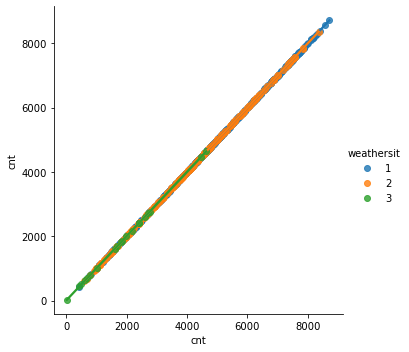

<Figure size 864x576 with 0 Axes>

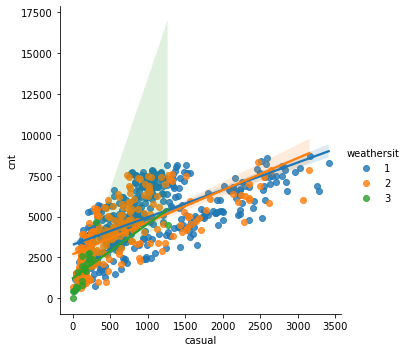

<Figure size 864x576 with 0 Axes>

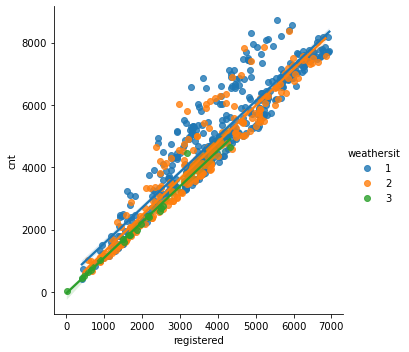

In [136]:
for j in cat_variables:
    for i in count_variables:
        plt.figure(figsize=(12,8))
        sns.lmplot(x=i,y='cnt',data=day,hue= j)

### Creating pair plot 

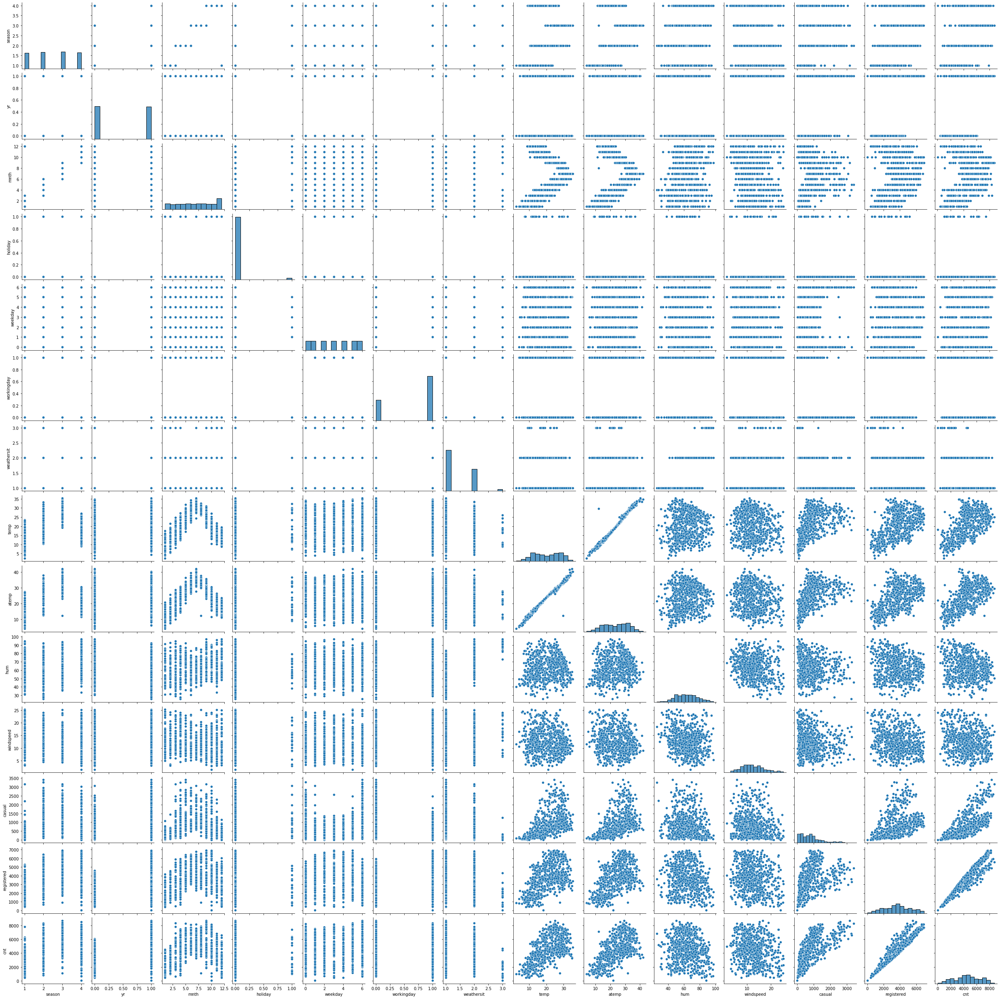

In [137]:
sns.pairplot(day)

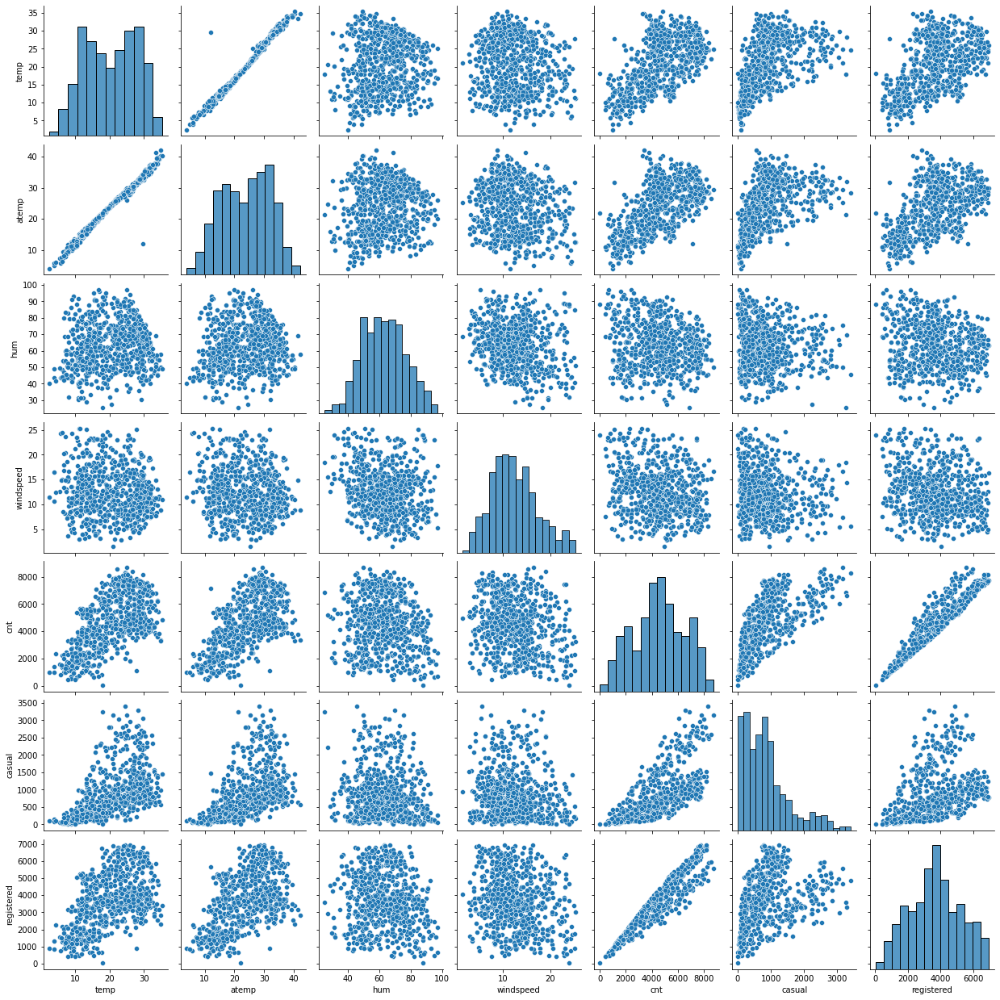

In [138]:
sns.pairplot(day[count_variables])

### Creating box plot between every categorical variable and numrical variable.

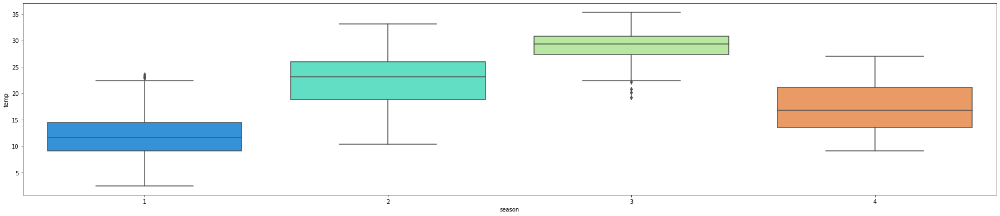

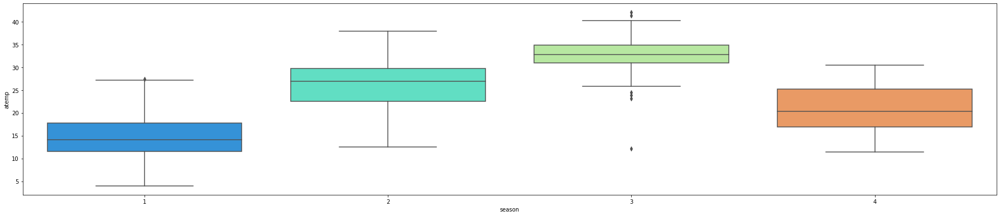

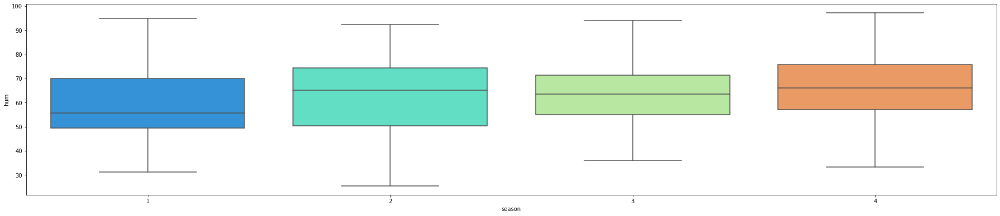

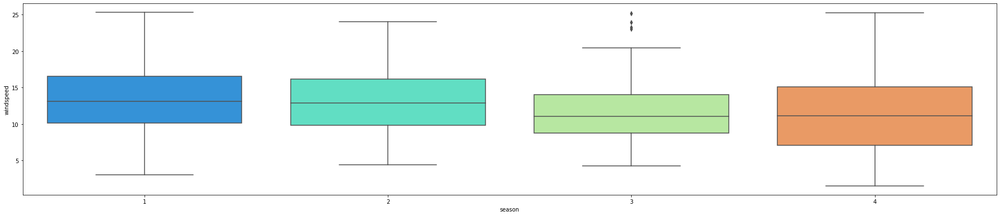

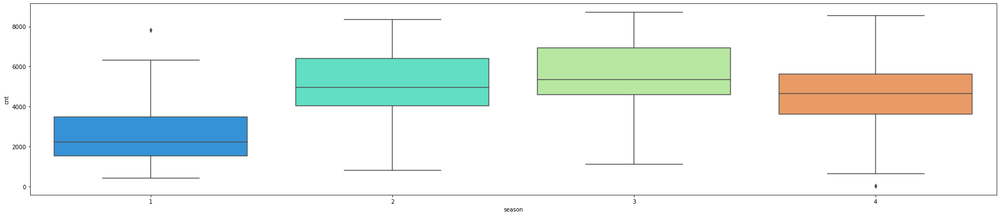

...

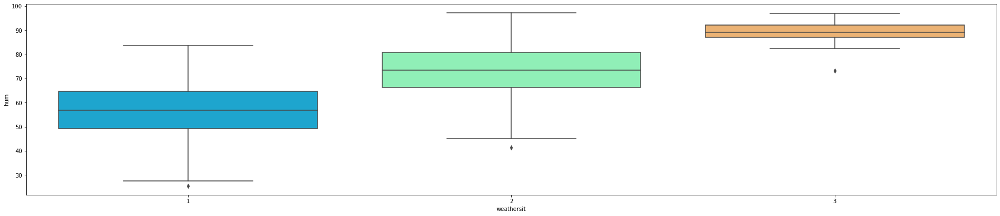

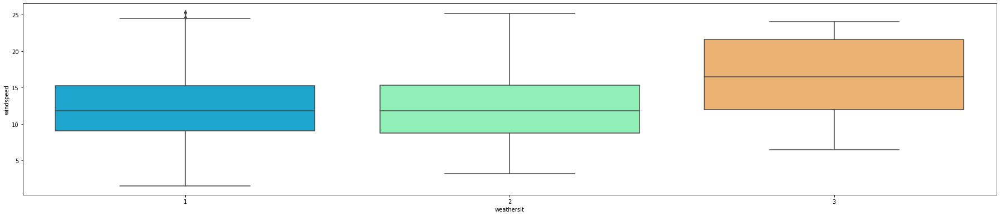

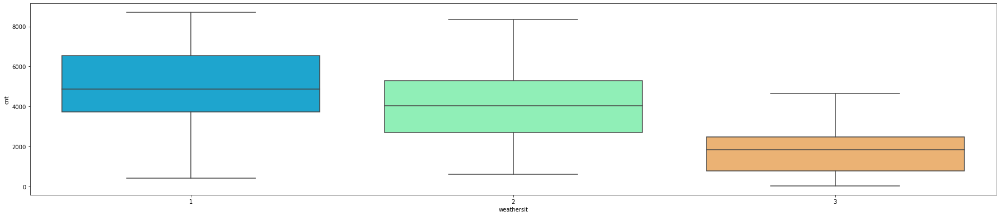

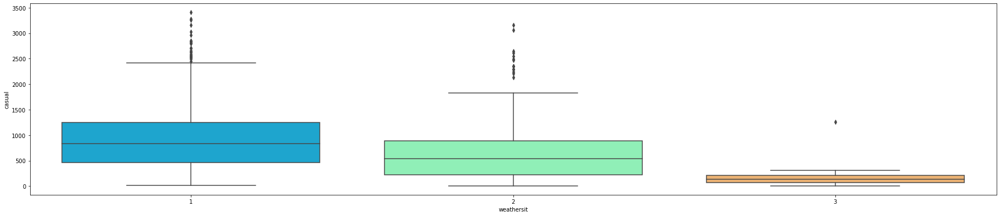

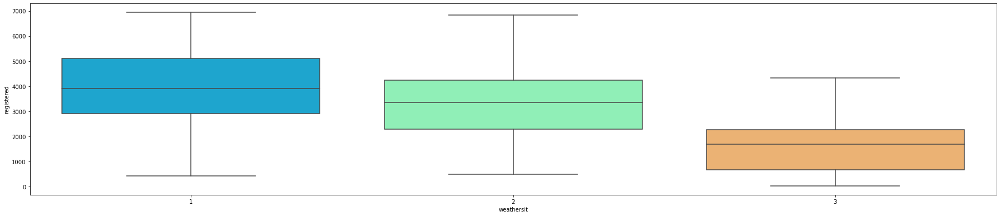

In [139]:
for j in cat_variables:
    for i in count_variables:
        sns.boxplot(y = day[i],x = day[j],palette='rainbow')
        plt.show()

### Heatmap

<AxesSubplot:>

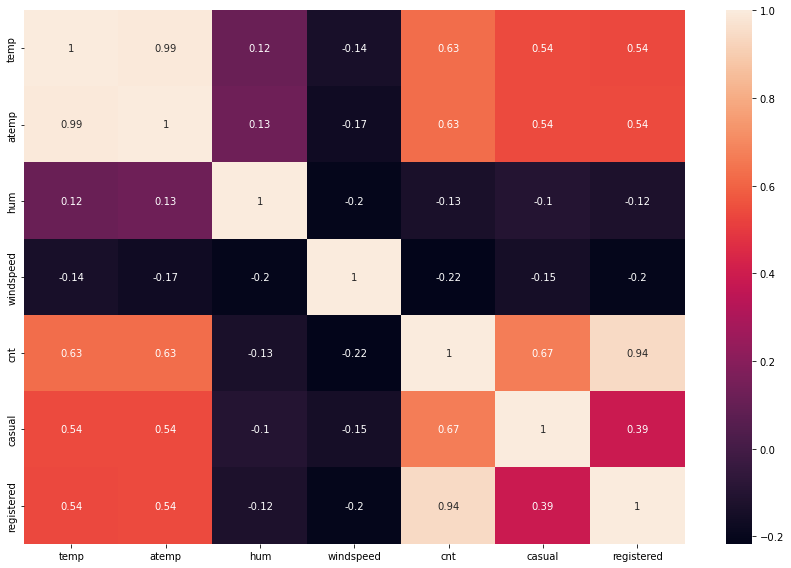

In [140]:
plt.figure(figsize=(12,8))
sns.heatmap(day[count_variables].corr(),annot = True)

### Need to remove atemp as temp and atemp are very strongly corelated.
### Need to remove registered and casual as I believe we can not get future values of this variables also the registered variable is highly correlated with the cnt.
### cnt = registered + casual

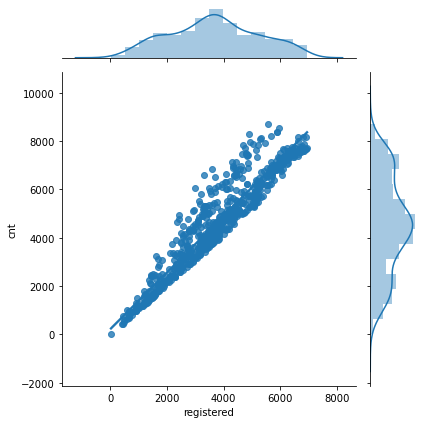

In [141]:
g = sns.JointGrid(x="registered", y="cnt", data=day)
g = g.plot(sns.regplot, sns.distplot)

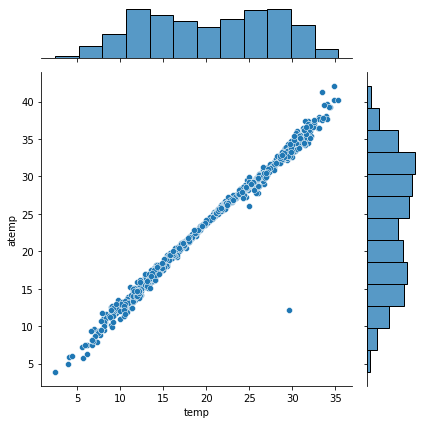

In [142]:
sns.jointplot(x='temp',y='atemp',data=day)

In [143]:
day.head()

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,0,1,0,6,0,2,14.110847,18.18125,80.5833,10.749882,331,654,985
1,1,0,1,0,0,0,2,14.902598,17.68695,69.6087,16.652113,131,670,801
2,1,0,1,0,1,1,1,8.050924,9.47025,43.7273,16.636703,120,1229,1349
3,1,0,1,0,2,1,1,8.200000,10.60610,59.0435,10.739832,108,1454,1562
4,1,0,1,0,3,1,1,9.305237,11.46350,43.6957,12.522300,82,1518,1600


In [144]:
day.drop(["atemp", "casual", "registered" ], axis = 1, inplace = True)

In [145]:
day.head()

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,hum,windspeed,cnt
0,1,0,1,0,6,0,2,14.110847,80.5833,10.749882,985
1,1,0,1,0,0,0,2,14.902598,69.6087,16.652113,801
2,1,0,1,0,1,1,1,8.050924,43.7273,16.636703,1349
3,1,0,1,0,2,1,1,8.200000,59.0435,10.739832,1562
4,1,0,1,0,3,1,1,9.305237,43.6957,12.522300,1600


# -----------------------------------------------------------------------------------------

# Modeling

# -----------------------------------------------------------------------------------------

## Data pre processing

In [146]:
cat =["season","yr","mnth","holiday","weekday",
                 "workingday","weathersit"]
count = ['temp','hum','windspeed','cnt']

### Encoding the categorical data to get the ligitimate modeling result using one hot encoding.

In [147]:
#Create object for one-hot encoding
encoder=ce.OneHotEncoder(cols=cat,handle_unknown='return_nan',return_df=True,use_cat_names=True)
#Fit and transform Data
day_final_data = encoder.fit_transform(day)

### Splitting the data into Train & Test data for the training and evaluation of the model.

In [148]:
# We specify this so that the train and test data set always have the same rows, respectively
df_train, df_test = train_test_split(day_final_data, train_size = 0.7, test_size = 0.3, random_state = 100)

### Scaling the numerical variables to keep each of the numerical values in same range. (Explained in detail in the pdf)

In [149]:
scaler = MinMaxScaler()

In [150]:
# Apply scaler() to all the columns except the 'yes-no' and 'dummy' variables
df_train[count] = scaler.fit_transform(df_train[count])
# Checking the values has been scaled or not
df_train.head()

,season_1.0,season_2.0,season_3.0,season_4.0,yr_0.0,yr_1.0,mnth_1.0,mnth_2.0,mnth_3.0,mnth_4.0,...,weekday_5.0,workingday_0.0,workingday_1.0,weathersit_2.0,weathersit_1.0,weathersit_3.0,temp,hum,windspeed,cnt
728,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.252441,0.293114,0.923102,0.204096
541,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.733702,0.126342,0.914353,0.853659
116,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.719799,0.826912,0.814718,0.442936
718,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,1.0,0.0,0.0,0.347624,0.572964,0.309436,0.472388
496,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.648145,0.288693,0.283207,0.852163


### Deriving the features and target columns from the train dataset to train the model.

In [151]:
y_train = df_train.pop('cnt')
X_train = df_train

### For selecting the best features we will be using a mixed approach of automatic and manual process.

### Recursive Feature Elimination (RFE) for Feature Selection (Automatically ranks the best features)

In [152]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm, 10)             # running RFE
rfe = rfe.fit(X_train, y_train)
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('season_1.0', True, 1),
 ('season_2.0', True, 1),
 ('season_3.0', True, 1),
 ('season_4.0', True, 1),
 ('yr_0.0', True, 1),
 ('yr_1.0', True, 1),
 ('mnth_1.0', False, 23),
 ('mnth_2.0', False, 20),
 ('mnth_3.0', False, 19),
 ('mnth_4.0', False, 18),
 ('mnth_5.0', False, 17),
 ('mnth_6.0', False, 16),
 ('mnth_7.0', False, 14),
 ('mnth_8.0', False, 15),
 ('mnth_9.0', False, 13),
 ('mnth_10.0', False, 12),
 ('mnth_11.0', False, 22),
 ('mnth_12.0', False, 21),
 ('holiday_0.0', False, 6),
 ('holiday_1.0', False, 5),
 ('weekday_6.0', False, 3),
 ('weekday_0.0', False, 4),
 ('weekday_1.0', False, 11),
 ('weekday_2.0', False, 10),
 ('weekday_3.0', False, 8),
 ('weekday_4.0', False, 9),
 ('weekday_5.0', False, 7),
 ('workingday_0.0', True, 1),
 ('workingday_1.0', True, 1),
 ('weathersit_2.0', True, 1),
 ('weathersit_1.0', True, 1),
 ('weathersit_3.0', False, 2),
 ('temp', False, 24),
 ('hum', False, 25),
 ('windspeed', False, 26)]

### Columns which rfe suggests

In [153]:
col = X_train.columns[rfe.support_]
col

Index(['season_1.0', 'season_2.0', 'season_3.0', 'season_4.0', 'yr_0.0',
       'yr_1.0', 'workingday_0.0', 'workingday_1.0', 'weathersit_2.0',
       'weathersit_1.0'],
      dtype='object')

### Columns which rfe  doesn't suggests

In [154]:
X_train.columns[~rfe.support_]

Index(['mnth_1.0', 'mnth_2.0', 'mnth_3.0', 'mnth_4.0', 'mnth_5.0', 'mnth_6.0',
       'mnth_7.0', 'mnth_8.0', 'mnth_9.0', 'mnth_10.0', 'mnth_11.0',
       'mnth_12.0', 'holiday_0.0', 'holiday_1.0', 'weekday_6.0', 'weekday_0.0',
       'weekday_1.0', 'weekday_2.0', 'weekday_3.0', 'weekday_4.0',
       'weekday_5.0', 'weathersit_3.0', 'temp', 'hum', 'windspeed'],
      dtype='object')

# -----------------------------------------------------------------------------------------

### Model 1

In [155]:
# Add a constant
X_train_sm = sm.add_constant(X_train)

### Fitting the model

In [156]:
lr = sm.OLS(y_train, X_train_sm).fit()

### Printing the summary of the model

In [157]:
print(lr.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.861
Model:                            OLS   Adj. R-squared:                  0.853
Method:                 Least Squares   F-statistic:                     108.7
Date:                Wed, 13 Jul 2022   Prob (F-statistic):          8.61e-184
Time:                        16:15:51   Log-Likelihood:                 528.87
No. Observations:                 501   AIC:                            -1002.
Df Residuals:                     473   BIC:                            -883.7
Df Model:                          27                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.0928      0.010      9.

### As we can see above there are some of the variables who's P-Value is not considerable so we will be dropping those variables. (P-Value cutoff < 0.05)

# -----------------------------------------------------------------------------------------

### Model 2

In [158]:
X_train_sm2 = X_train_sm

### Dropping the columns having P-Value < 0.05

In [159]:
X_train_sm2.drop(["season_2.0","mnth_1.0", "mnth_2.0", "mnth_6.0", "mnth_4.0", "mnth_7.0","holiday_1.0",
                  "mnth_8.0", "mnth_10.0", "weekday_4.0","weekday_1.0","weekday_2.0" ], axis = 1, inplace = True)

### Fitting the model

In [160]:
lr2 = sm.OLS(y_train, X_train_sm2).fit()

### Printing the summary of the model

In [161]:
print(lr2.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.858
Model:                            OLS   Adj. R-squared:                  0.852
Method:                 Least Squares   F-statistic:                     152.7
Date:                Wed, 13 Jul 2022   Prob (F-statistic):          8.54e-190
Time:                        16:15:51   Log-Likelihood:                 522.78
No. Observations:                 501   AIC:                            -1006.
Df Residuals:                     481   BIC:                            -921.2
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const           3.408e+11   2.49e+11      1.

### We will be checking the P-Value of the variables and also need to check the variance inflation factor

In [162]:
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_sm2.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm2.values, i) for i in range(X_train_sm2.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features         VIF
12     weekday_6.0         inf
17  workingday_1.0         inf
4           yr_0.0         inf
5           yr_1.0         inf
13     weekday_0.0         inf
11     holiday_0.0         inf
18  weathersit_2.0  5244402.85
20  weathersit_3.0  5093803.10
16  workingday_0.0    54778.93
19  weathersit_1.0    37246.69
21            temp        4.16
2       season_3.0        3.50
3       season_4.0        3.16
1       season_1.0        2.86
22             hum        2.11
9        mnth_11.0        1.83
7         mnth_5.0        1.69
10       mnth_12.0        1.43
8         mnth_9.0        1.25
6         mnth_3.0        1.19
23       windspeed        1.18
15     weekday_5.0        1.16
14     weekday_3.0        1.16
0            const        0.00


### As we can see above there are many variable who's vif is infinite this comes in a case where there are many multicollinearity between the variables so we need to check the correlation among the variables. (Detail explanation is given in the pdf)

<AxesSubplot:>

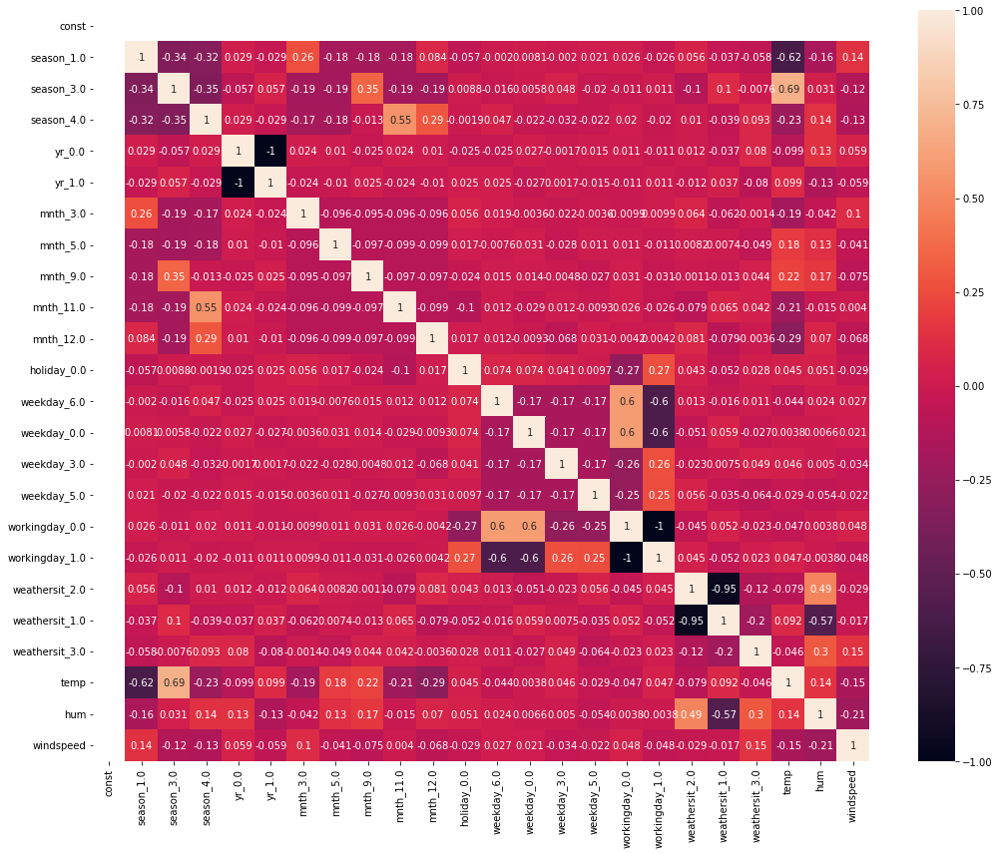

In [163]:
plt.figure(figsize=(15,12))
sns.heatmap(X_train_sm2.corr(),annot = True)

### From the above heatmap we get to know that
1. yr_0 and yr_1 are highly correlated
2. holiday_0 and holiday_1 are highly correlated
3. workingday_1 and workingday_0 are highly correlated
4. weathersite_1 and weathersite_2 are highly correlated

We will look at the p-values, vif, and rfe and drop the columns which are necessary to do so.

# -----------------------------------------------------------------------------------------

### Model 3

In [164]:
X_train_sm3 = X_train_sm2

### Dropping the necessary columns

In [165]:
X_train_sm3.drop([ "weathersit_1.0", "workingday_1.0","holiday_0.0","yr_0.0","season_3.0"], axis = 1, inplace = True)

### Fitting the model

In [166]:
lr3 = sm.OLS(y_train, X_train_sm3).fit()

### Printing the summary of the model

In [167]:
print(lr3.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.858
Model:                            OLS   Adj. R-squared:                  0.852
Method:                 Least Squares   F-statistic:                     161.2
Date:                Wed, 13 Jul 2022   Prob (F-statistic):          1.07e-190
Time:                        16:15:56   Log-Likelihood:                 522.28
No. Observations:                 501   AIC:                            -1007.
Df Residuals:                     482   BIC:                            -926.4
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.2896      0.027     10.

### Many of the P-Values are in range but still needs to be below the cutoff value.

In [168]:
import pandas as pd
pd.set_option('display.max_rows', None)
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_sm3.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm3.values, i) for i in range(X_train_sm3.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features    VIF
0            const  47.51
13  workingday_0.0   7.39
10     weekday_0.0   4.85
9      weekday_6.0   4.82
16            temp   2.95
1       season_1.0   2.82
2       season_4.0   2.47
17             hum   2.11
7        mnth_11.0   1.77
14  weathersit_2.0   1.65
8        mnth_12.0   1.40
15  weathersit_3.0   1.39
5         mnth_5.0   1.21
18       windspeed   1.18
11     weekday_3.0   1.16
12     weekday_5.0   1.16
6         mnth_9.0   1.15
4         mnth_3.0   1.14
3           yr_1.0   1.06


<AxesSubplot:>

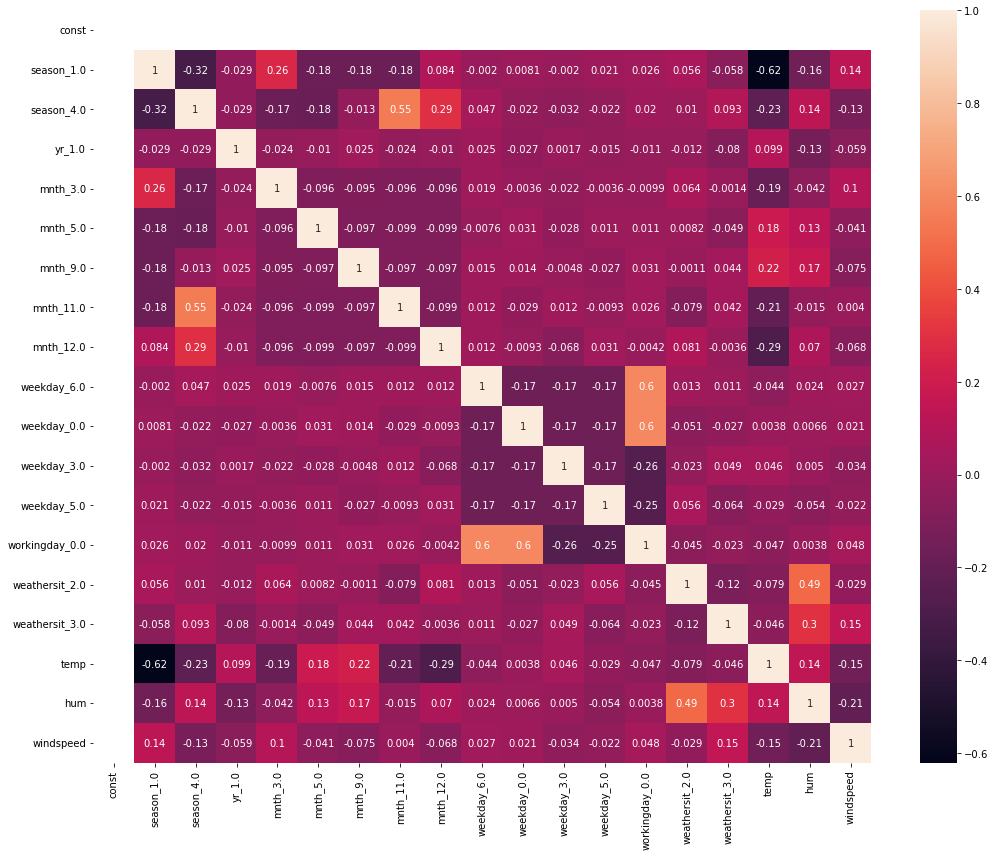

In [169]:
plt.figure(figsize=(15,12))
sns.heatmap(X_train_sm3.corr(),annot = True)

# -----------------------------------------------------------------------------------------

### Model 4

In [170]:
X_train_sm4 = X_train_sm3

### Dropping the necesary columns

In [171]:
X_train_sm4.drop([  "workingday_0.0","weekday_3.0","weekday_5.0"], axis = 1, inplace = True)

### Fitting the model

In [172]:
lr4 = sm.OLS(y_train, X_train_sm4).fit()

### Printing the summary

In [173]:
print(lr4.summary())

                            OLS Regression Results                            
Dep. Variable:                    cnt   R-squared:                       0.852
Model:                            OLS   Adj. R-squared:                  0.847
Method:                 Least Squares   F-statistic:                     186.1
Date:                Wed, 13 Jul 2022   Prob (F-statistic):          4.39e-190
Time:                        16:15:59   Log-Likelihood:                 512.66
No. Observations:                 501   AIC:                            -993.3
Df Residuals:                     485   BIC:                            -925.8
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const              0.2993      0.027     11.

In [174]:
import pandas as pd
pd.set_option('display.max_rows', None)
# Check for the VIF values of the feature variables. 
from statsmodels.stats.outliers_influence import variance_inflation_factor
# Create a dataframe that will contain the names of all the feature variables and their respective VIFs
vif = pd.DataFrame()
vif['Features'] = X_train_sm4.columns
vif['VIF'] = [variance_inflation_factor(X_train_sm4.values, i) for i in range(X_train_sm4.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
print(vif)

          Features    VIF
0            const  45.71
13            temp   2.94
1       season_1.0   2.81
2       season_4.0   2.47
14             hum   2.10
7        mnth_11.0   1.75
11  weathersit_2.0   1.65
8        mnth_12.0   1.39
12  weathersit_3.0   1.38
5         mnth_5.0   1.21
15       windspeed   1.18
6         mnth_9.0   1.15
4         mnth_3.0   1.14
3           yr_1.0   1.06
9      weekday_6.0   1.04
10     weekday_0.0   1.04


### The P-Value is in range for all the variables and also the vif values looks fine we can move forward with this model.
### We can consider Model 4 as our final model.

# -----------------------------------------------------------------------------------------

### Residual Analysis of the train data

In [175]:
y_train_predict = lr4.predict(X_train_sm4)

### Plot the histogram of the error terms

Text(0.5, 0, 'Errors')

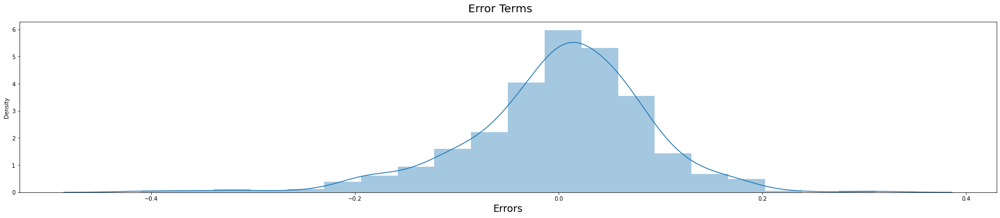

In [176]:
fig = plt.figure()
sns.distplot((y_train - y_train_predict), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

### Looking for patterns in the residuals

In [177]:
res = (y_train - y_train_predict)

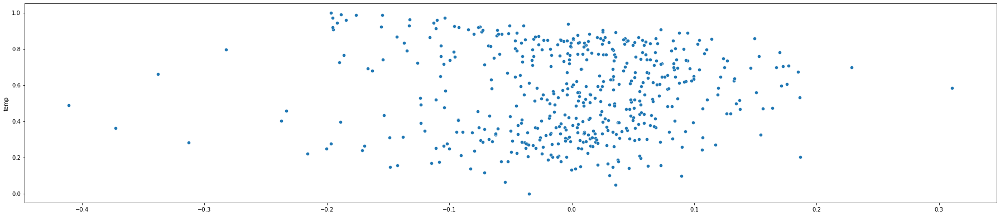

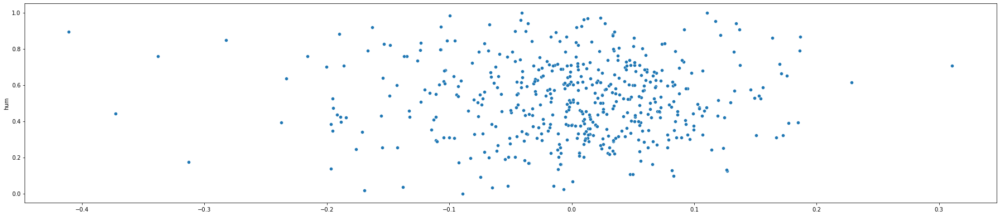

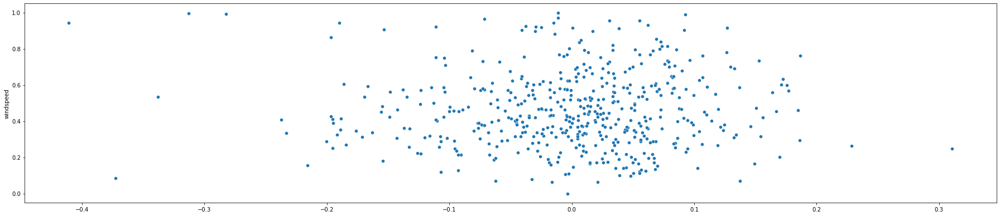

In [178]:
column = ['temp','hum','windspeed']
for i in column :
    sns.scatterplot(y = X_train_sm4[i],x = res)
    plt.show()

# -----------------------------------------------------------------------------------------

### Predictions on the Test Set

### Need to scale the test dataset values also as we had also scaled the traing dataset.

In [179]:
df_test[count] = scaler.transform(df_test[count])

In [180]:
df_test.describe()

,season_1.0,season_2.0,season_3.0,season_4.0,yr_0.0,yr_1.0,mnth_1.0,mnth_2.0,mnth_3.0,mnth_4.0,...,weekday_5.0,workingday_0.0,workingday_1.0,weathersit_2.0,weathersit_1.0,weathersit_3.0,temp,hum,windspeed,cnt
count,215.000000,215.000000,215.00000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,...,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000,215.000000
mean,0.232558,0.279070,0.24186,0.246512,0.516279,0.483721,0.069767,0.088372,0.069767,0.093023,...,0.144186,0.311628,0.688372,0.279070,0.683721,0.037209,0.578678,0.513819,0.458021,0.518992
std,0.423449,0.449589,0.42921,0.431986,0.500901,0.500901,0.255349,0.284498,0.255349,0.291143,...,0.352098,0.464240,0.464240,0.449589,0.466108,0.189716,0.234997,0.213246,0.190473,0.213323
min,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.047987,-0.054327,0.055979,0.048205
25%,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.379174,0.345230,0.308596,0.374655
50%,0.000000,0.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,0.000000,1.000000,0.000000,0.605366,0.503474,0.447571,0.525081
75%,0.000000,1.000000,0.00000,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.771134,0.666456,0.576917,0.671767
max,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.029946,1.034745,0.914328,0.951680


### Deriving the features and target columns from the test dataset to test the model.

In [181]:
y_test = df_test.pop('cnt')
X_test = df_test

In [182]:
# Adding constant variable to test dataframe
X_test_sm4 = sm.add_constant(X_test)

### Dropping the columns which were not used in the training dataset as the shape of both the training and testing dataset should match

In [183]:
X_test_sm4 = X_test_sm4.filter([ 'const','season_1.0', 'season_4.0', 'yr_1.0', 'mnth_3.0', 'mnth_5.0',
       'mnth_9.0', 'mnth_11.0', 'mnth_12.0', 'weekday_6.0', 'weekday_0.0',
       'weathersit_2.0', 'weathersit_3.0', 'temp', 'hum', 'windspeed'])

# -----------------------------------------------------------------------------------------

### Model Evaluation

### Making predictions using the fourth model

In [184]:
y_test_predict = lr4.predict(X_test_sm4)

### Plotting y_test and y_pred to understand the spread

Text(0, 0.5, 'y_pred')

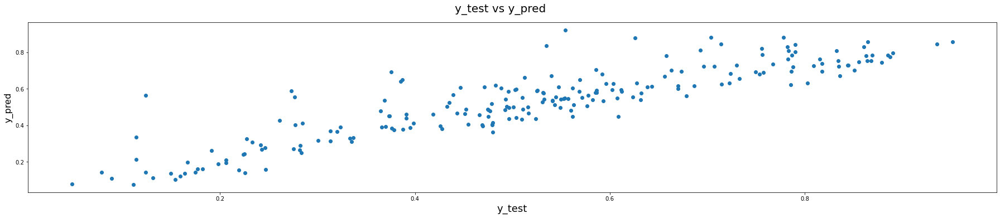

In [185]:
fig = plt.figure()
plt.scatter(y_test, y_test_predict)
fig.suptitle('y_test vs y_pred', fontsize = 20)              # Plot heading 
plt.xlabel('y_test', fontsize = 18)                          # X-label
plt.ylabel('y_pred', fontsize = 16)      

### R Square Value

In [186]:
r_squared = r2_score(y_test, y_test_predict)
r_squared

0.7927776333884656

### Other metrics to evaluate the model

In [187]:
print('MAE:', metrics.mean_absolute_error(y_test, y_test_predict))
print('MSE:', metrics.mean_squared_error(y_test, y_test_predict))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, y_test_predict)))

MAE: 0.0684710970220997
MSE: 0.009386184921592008
RMSE: 0.0968823251248235


### Code to find out the coefficient of each variable used in the model.

In [188]:
df = pd.read_html(lr4.summary().tables[1].as_html(),header=0,index_col=0)[0]

In [189]:
season_1 =df['coef'].values[1]
season_4=df['coef'].values[2]
yr_1=df['coef'].values[3]
mnth_3=df['coef'].values[4]
mnth_5=df['coef'].values[5]
mnth_9=df['coef'].values[6]
mnth_11=df['coef'].values[7]
mnth_12=df['coef'].values[8]
weekday_6=df['coef'].values[9]
weekday_0=df['coef'].values[10]
weathersit_2=df['coef'].values[11]
weathersit_3=df['coef'].values[12]
temp=df['coef'].values[13]
hum=df['coef'].values[14]
windspeed=df['coef'].values[15]

### Model Equation
#### cnt = const - 0.112208*(season_1.0) + 0.099785*(season_4.0) + 0.229710*(yr_1.0) + 0.050386*(mnth_3.0) + 0.048037*(mnth_5.0) + 0.077058*(mnth_9.0) - 0.069926*(mnth_11.0) - 0.035620*(mnth_12.0) + 0.028668*(weekday_6.0) - 0.031093*(weekday_0.0) - 0.042208*(weathersit_2.0) - 0.205873*(weathersit_3.0) + 0.436354*(temp) - 0.129626*(hum) - 0.115964*(windspeed)

# -----------------------------------------------------------------------------------------

### Alternate Model
#### Model created using pipeline (Which automates all the process from data preprocessing to fitting the model)

In [190]:
#Loading the data set
day = pd.read_csv("day.csv",low_memory=False)
#Dropping the necessary columns
day.drop(["atemp", "casual", "registered" ], axis = 1, inplace = True)
day.drop(["instant", "dteday" ], axis = 1, inplace = True)
#Splitting the features and the target
X= day.iloc[:,:-1]
y = day.cnt
#Splitting the data into train and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.20, random_state = 3)

In [191]:
"""
This is needed so that at the time of our column transform the column 
transform should be known about which columns to scale and which to encode.
"""
cat =["season","yr","mnth","holiday","weekday",
                 "workingday","weathersit"]
count = ['temp','hum','windspeed']

### Column transformation

In [192]:
cols_trans = ColumnTransformer([
    ('ohe', OneHotEncoder(drop='first'), cat),
    ('scl', StandardScaler(),count)
])

### Pipeline creating 

In [193]:
lr_pipe = Pipeline([
    ('trans', cols_trans),
    ('clf',LinearRegression())
])

In [194]:
lr_pipe.fit(X_train, y_train)

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('ohe',
                                                  OneHotEncoder(drop='first'),
                                                  ['season', 'yr', 'mnth',
                                                   'holiday', 'weekday',
                                                   'workingday',
                                                   'weathersit']),
                                                 ('scl', StandardScaler(),
                                                  ['temp', 'hum',
                                                   'windspeed'])])),
                ('clf', LinearRegression())])

### Checking the parameters of the pipeline

In [195]:
lr_pipe.get_params()

{'memory': None,
 'steps': [('trans',
   ColumnTransformer(transformers=[('ohe', OneHotEncoder(drop='first'),
                                    ['season', 'yr', 'mnth', 'holiday', 'weekday',
                                     'workingday', 'weathersit']),
                                   ('scl', StandardScaler(),
                                    ['temp', 'hum', 'windspeed'])])),
  ('clf', LinearRegression())],
 'verbose': False,
 'trans': ColumnTransformer(transformers=[('ohe', OneHotEncoder(drop='first'),
                                  ['season', 'yr', 'mnth', 'holiday', 'weekday',
                                   'workingday', 'weathersit']),
                                 ('scl', StandardScaler(),
                                  ['temp', 'hum', 'windspeed'])]),
 'clf': LinearRegression(),
 'trans__n_jobs': None,
 'trans__remainder': 'drop',
 'trans__sparse_threshold': 0.3,
 'trans__transformer_weights': None,
 'trans__transformers': [('ohe',
   OneHotEncoder(drop='

In [198]:
from sklearn import set_config
set_config(display='diagram')
# with display='diagram', simply use display() to see the diagram
display(lr_pipe)
# if desired, set display back to the default
set_config(display='text')

Pipeline(steps=[('trans',
                 ColumnTransformer(transformers=[('ohe',
                                                  OneHotEncoder(drop='first'),
                                                  ['season', 'yr', 'mnth',
                                                   'holiday', 'weekday',
                                                   'workingday',
                                                   'weathersit']),
                                                 ('scl', StandardScaler(),
                                                  ['temp', 'hum',
                                                   'windspeed'])])),
                ('clf', LinearRegression())])

### R Square Value

In [197]:
print('Test Score of Linear Regression Model: %.3f' % lr_pipe.score(X_test, y_test))

Test Score of Linear Regression Model: 0.824
